Finans tweetlerinin tespiti ile alakalı çalışıldı

# [1. Ön işleme Yok](#b1)

* #### [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Unzipping corpora/gutenberg.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Mounted at /content/drive
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'

df = pd.read_csv(file_path4, encoding='latin1', header=None)
#df = pd.read_csv(file_path4, index_col=0)

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
df.columns=['Text','tokens', 'text_length', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPLSTMPrePRro',
       'score', 'oh_label']

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
#df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df=df.drop(df.index[0])

In [ ]:
df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,finnish bore own rettig famili grown recent acquisit smaller ship compani,1,2,1
9740,"Operating prof

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df['score']

,score
1,-1
2,-1
3,-1
4,-1
5,-1
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
df['score2']

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


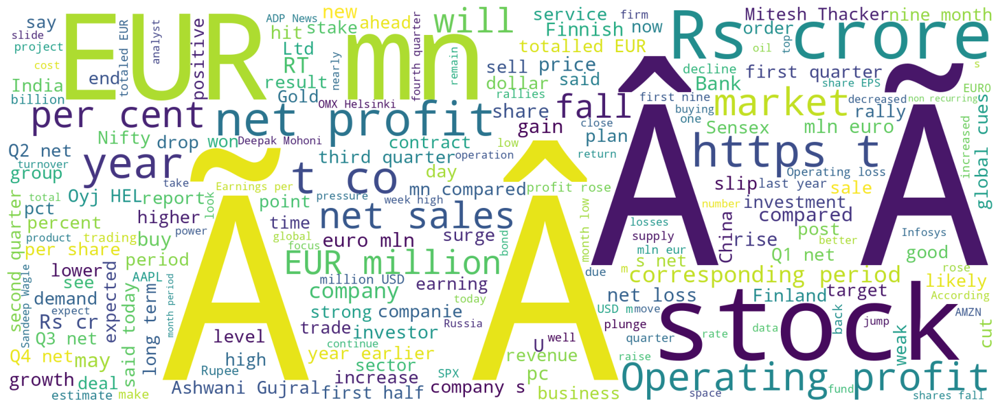

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
#secilen_kolon_adi='USAirPrePro2'
secilen_kolon_adi='Text'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df['score2']


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name='score2')


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=df[[secilen_kolon_adi,'score2']]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data.head()

,Text,score2
1,"At Wipro, growth remains a mirage",0
2,Why Chinese stocks leave US investors vulnerable,0
3,US stocks finish mixed amid more tech selling,0
4,Opec reduces estimate on oil demand growth,0
5,Immediate support for rupee is placed at 55.10: Bonanza,0


In [ ]:
X_df.head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


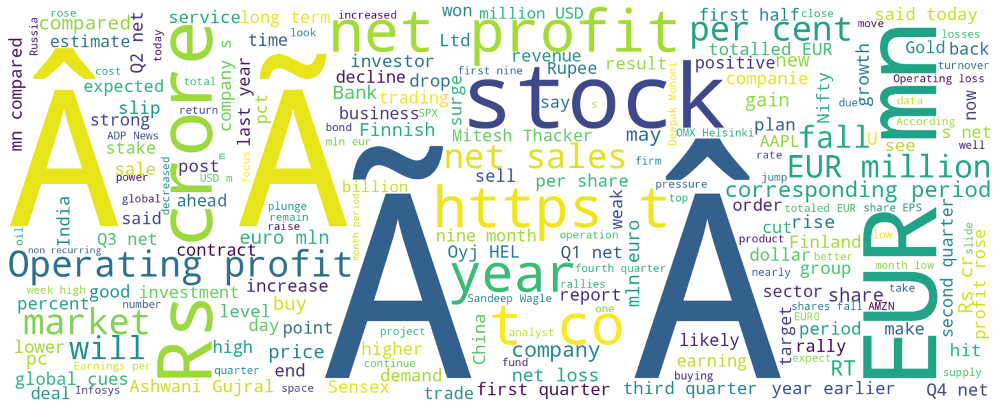

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

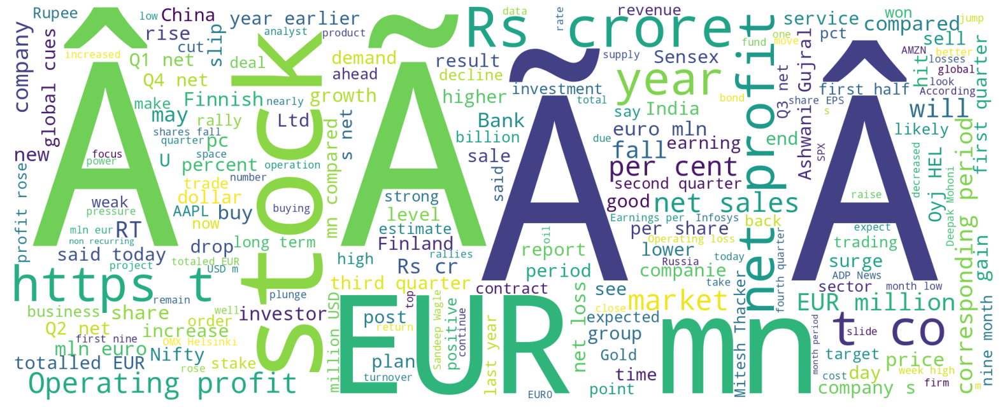

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
x = df[secilen_kolon_adi]
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
y = df['score2']
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

######  [keşifsel veri analizi için deneme](#b1)


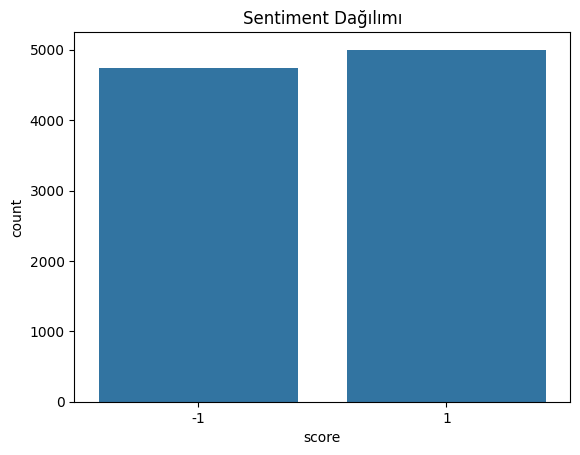

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

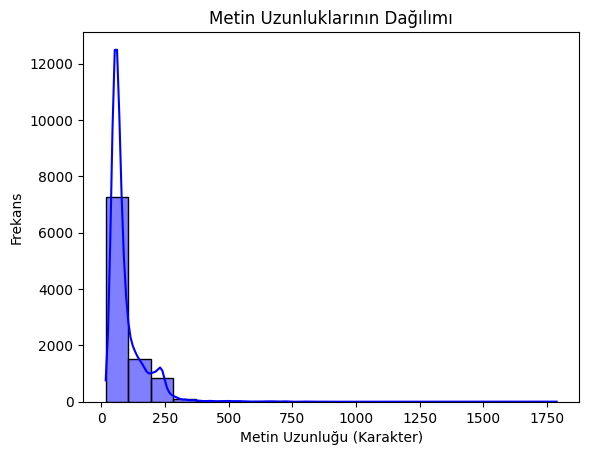

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

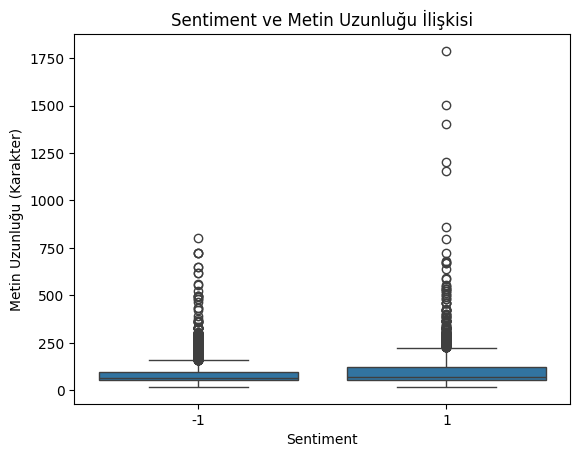

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

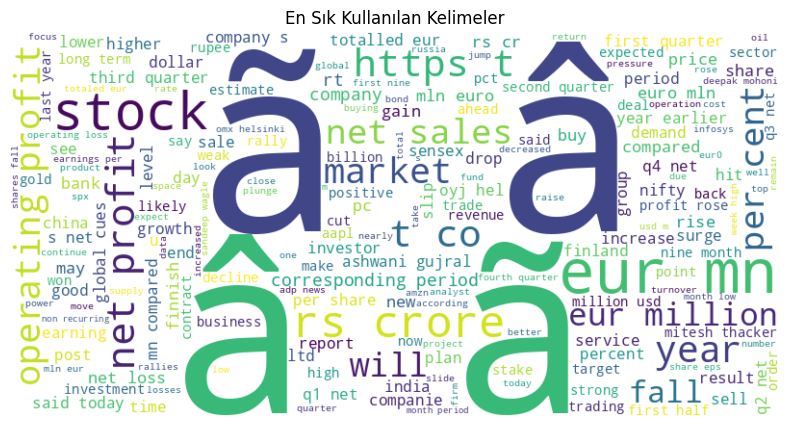

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == 1]['Text']).lower()
negative_text = " ".join(df[df['score'] == -1]['Text']).lower()
neutral_text = " ".join(df[df['score'] == 0]['Text']).lower()

In [ ]:
positive_text

'euronext to list first on french, dutch, belgian exchanges glaxosmithkline consumer hits 52-week high on expansion plans snowmans ipo gets overwhelming response, subscribing 60 times small investors find merit in beaten-down midcaps like kfa, suzlon energy, lanco infra jyothy labs q3 net up by 27.9 per cent edelweiss maintains buy on irb infrastructure `` the number of collection errors fell considerably , and operations speeded up .  4 february 2011 - finnish broadband data communication systems provider teleste oyj hel : tlt1v saw its net profit jump to eur2 .1 m for the last quarter of 2010 from eur995 ,000 for the same period of 2009 .  outotec oyj press release , february 19 , 2008 at 11.00 am outotec has won two large minerals processing technology orders from mirabela mineracao do brasil ltda , brazil and from cumerio med jsco , bulgaria .  sensex hits record all-time high; nifty races past 7,600 finnish kci konecranes has been awarded an order for four hot metal ladle cranes b

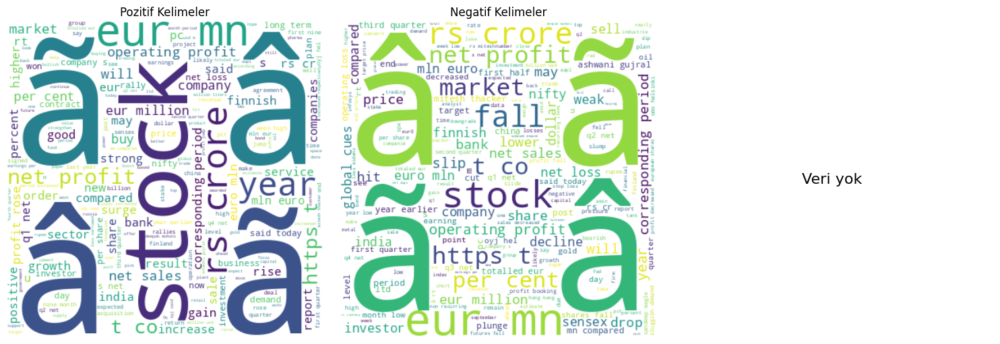

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


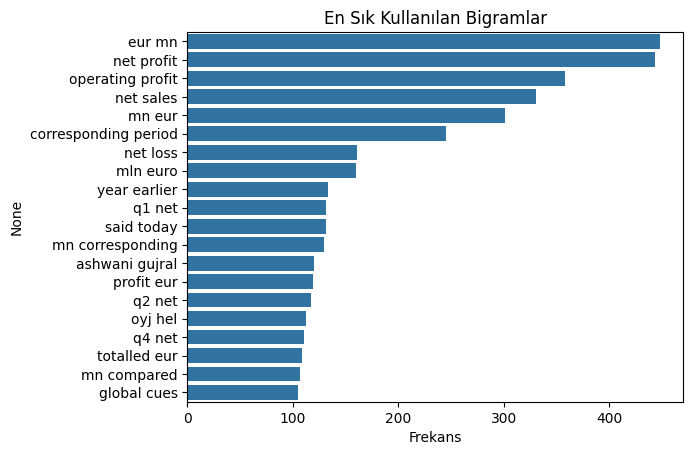

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df['Text'])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* #### [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

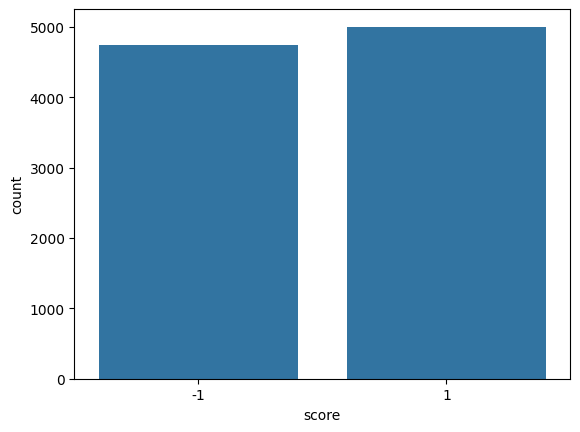

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(6818, 10000) (2923, 10000)


In [ ]:
print(test_vectors)

  (0, 311)	0.3252826423296613
  (0, 892)	0.23116621722716008
  (0, 1106)	0.2166749937268119
  (0, 1153)	0.2829473559490798
  (0, 1192)	0.2155415226500559
  (0, 1342)	0.13471789313825477
  (0, 1817)	0.29857205052618396
  (0, 1881)	0.29403325317545304
  (0, 2345)	0.16368760725242748
  (0, 2573)	0.2829473559490798
  (0, 2872)	0.17283570227679979
  (0, 4402)	0.17989840040265362
  (0, 4511)	0.16562595819793438
  (0, 4856)	0.33636853955603463
  (0, 6200)	0.18745942529451046
  (0, 7622)	0.1751143110821646
  (0, 8648)	0.21844027511575173
  (0, 9032)	0.20984138518314424
  (0, 9065)	0.07948846914627122
  (1, 16)	0.32624085355303156
  (1, 213)	0.1575561421445402
  (1, 214)	0.15436916837300885
  (1, 828)	0.3117592862925318
  (1, 1205)	0.10852275242971766
  (1, 1998)	0.12832942015797827
  :	:
  (2921, 1153)	0.2444142076513643
  (2921, 1192)	0.18618802885708088
  (2921, 2345)	0.14139583207891745
  (2921, 2412)	0.23282001056751053
  (2921, 2714)	0.2213411942646591
  (2921, 3833)	0.10043869087729884
 


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  86.00752651385562


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

           0       0.87      0.84      0.85      1432
           2       0.85      0.88      0.86      1491

    accuracy                           0.86      2923
   macro avg       0.86      0.86      0.86      2923
weighted avg       0.86      0.86      0.86      2923



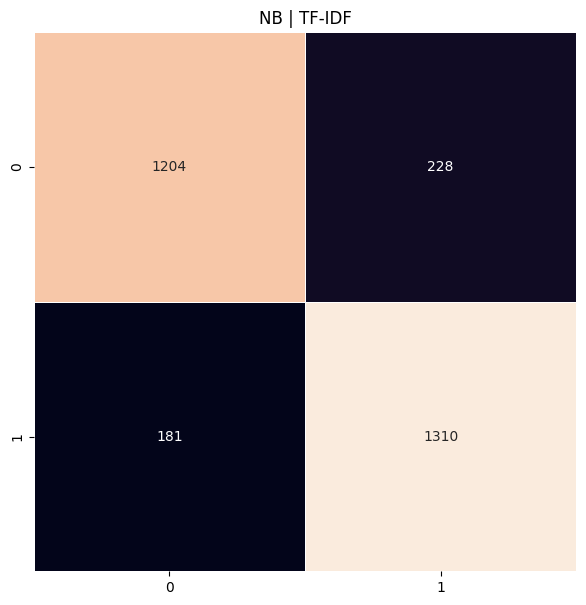

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

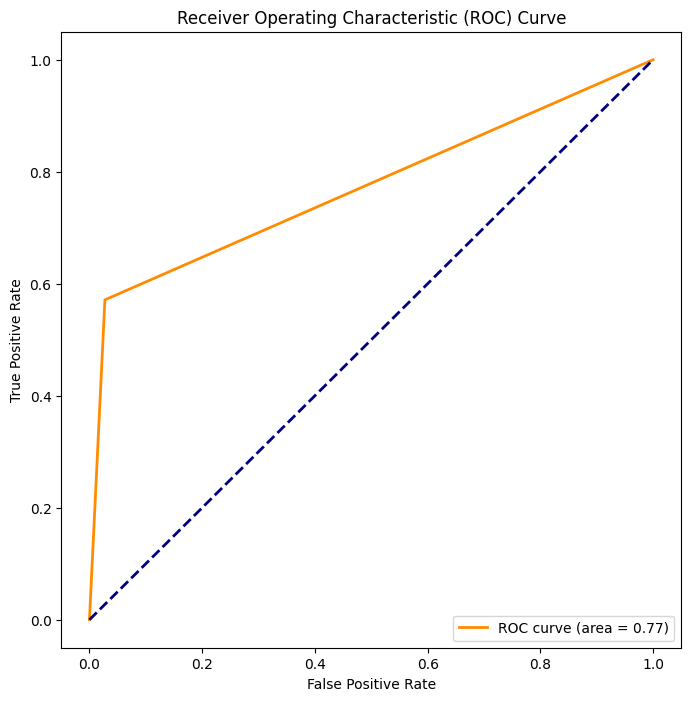

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  90.14710913445091


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1432
           1       0.89      0.92      0.90      1491

    accuracy                           0.90      2923
   macro avg       0.90      0.90      0.90      2923
weighted avg       0.90      0.90      0.90      2923



In [ ]:
y_test.head(500)

,score
4464,0
3290,0
8420,0
7608,0
6867,0
...,...
6428,0
1635,0
9594,0
10913,0


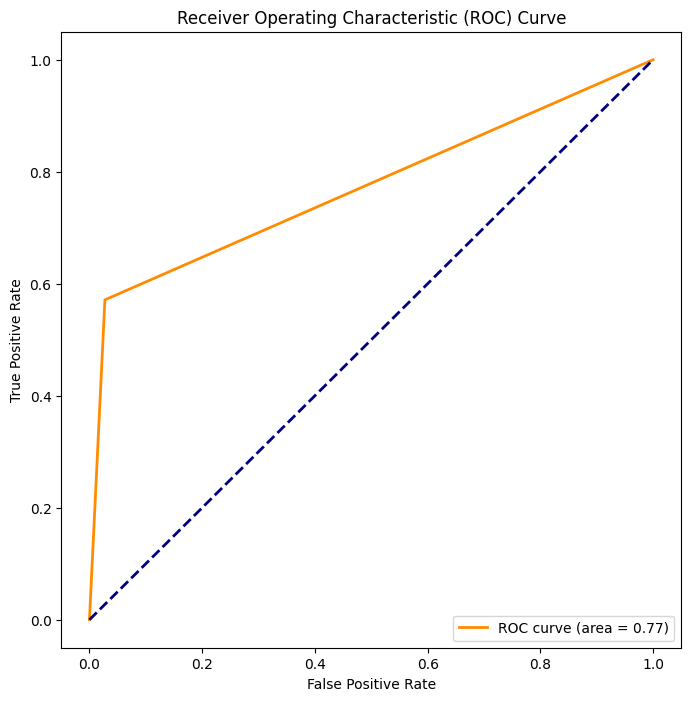

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


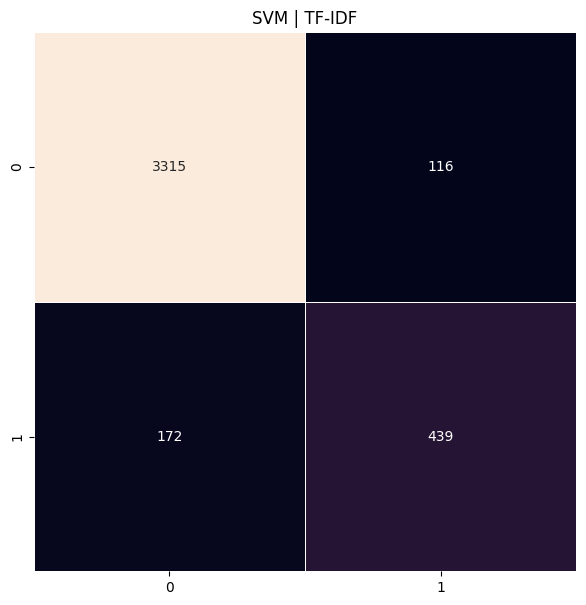

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  87.92336640437907


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3431
           1       0.79      0.57      0.66       611

    accuracy                           0.91      4042
   macro avg       0.86      0.77      0.81      4042
weighted avg       0.91      0.91      0.91      4042



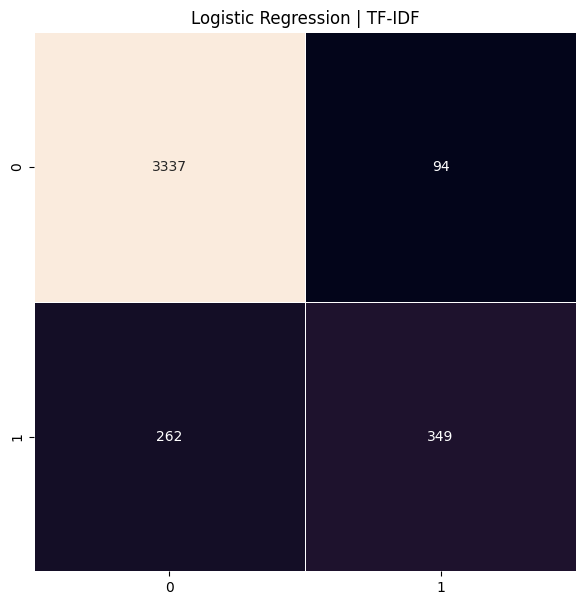

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score
4464,0
3290,0
8420,0
7608,0
6867,0
...,...
186,0
3754,0
7975,0
9469,0


In [ ]:
predictions_log

AttributeError: 'numpy.ndarray' object has no attribute 'head'

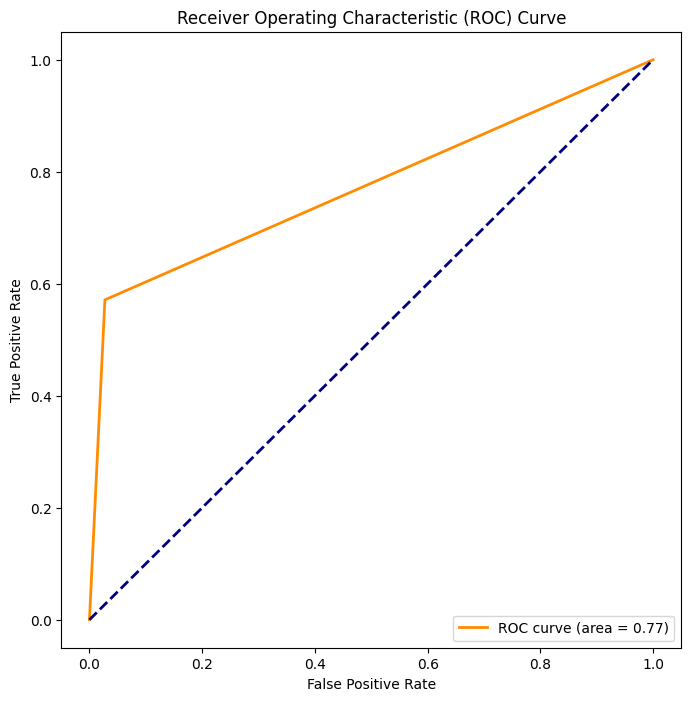

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_test = y_test.astype(int)
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  74.13616147793363


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1157
           1       0.92      0.06      0.12       191

    accuracy                           0.87      1348
   macro avg       0.89      0.53      0.52      1348
weighted avg       0.87      0.87      0.81      1348



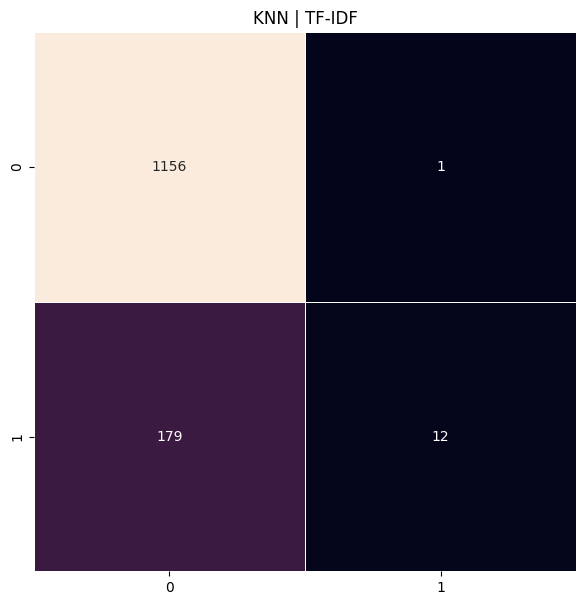

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

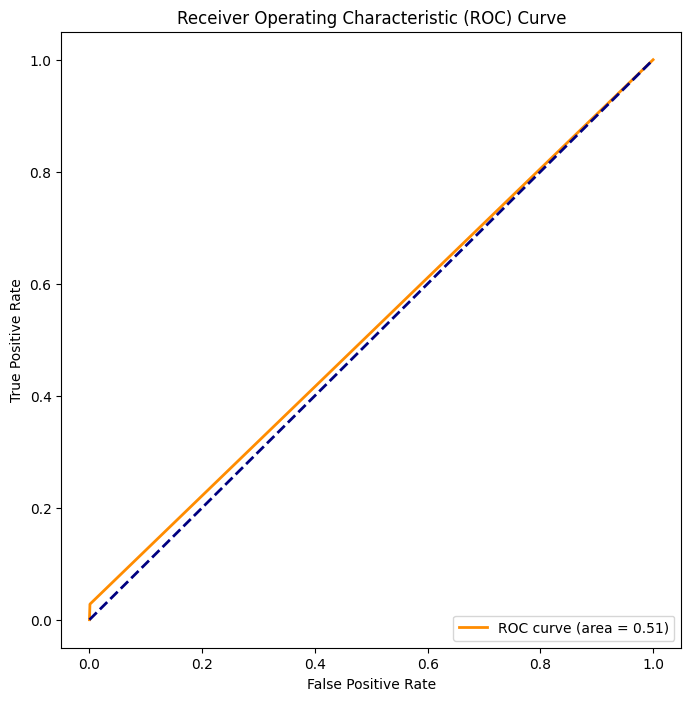

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_test = y_test.astype(int)
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  86.04173794047212


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.95      0.94      0.95      3431
           1       0.70      0.71      0.70       611

    accuracy                           0.91      4042
   macro avg       0.82      0.83      0.82      4042
weighted avg       0.91      0.91      0.91      4042



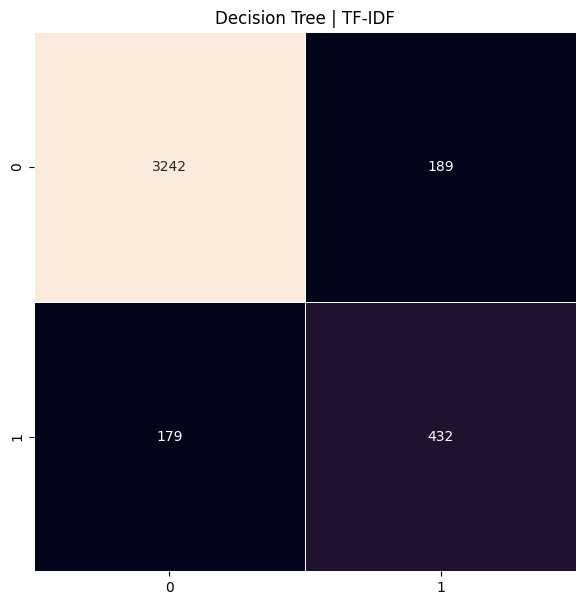

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_test = y_test.astype(int)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  87.30756072528224


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.94      0.97      0.96      3431
           1       0.82      0.63      0.71       611

    accuracy                           0.92      4042
   macro avg       0.88      0.80      0.83      4042
weighted avg       0.92      0.92      0.92      4042



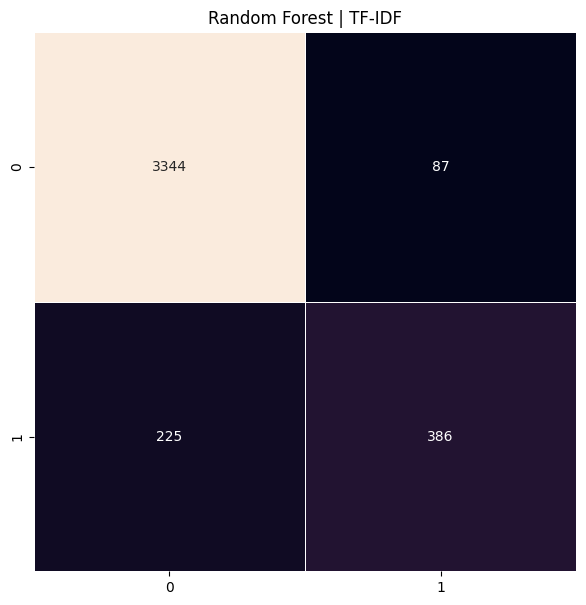

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* #### [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(6818, 10000) (2923, 10000)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  86.82860075265138


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.85      0.88      0.87      1432
           1       0.88      0.85      0.87      1491

    accuracy                           0.87      2923
   macro avg       0.87      0.87      0.87      2923
weighted avg       0.87      0.87      0.87      2923



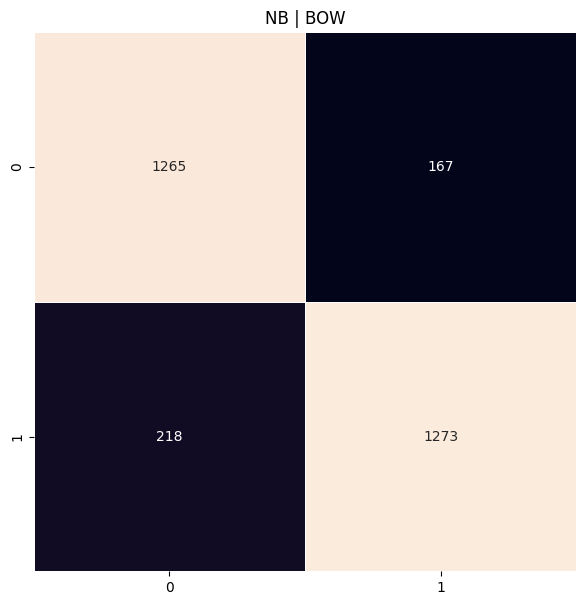

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  89.56551488197057


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3431
           1       0.74      0.72      0.73       611

    accuracy                           0.92      4042
   macro avg       0.84      0.84      0.84      4042
weighted avg       0.92      0.92      0.92      4042



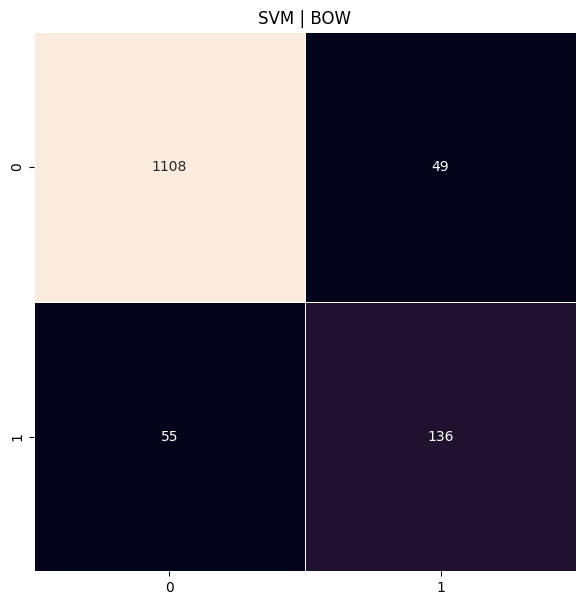

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  89.63393773520356


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3431
           1       0.79      0.69      0.73       611

    accuracy                           0.92      4042
   macro avg       0.87      0.83      0.85      4042
weighted avg       0.92      0.92      0.92      4042



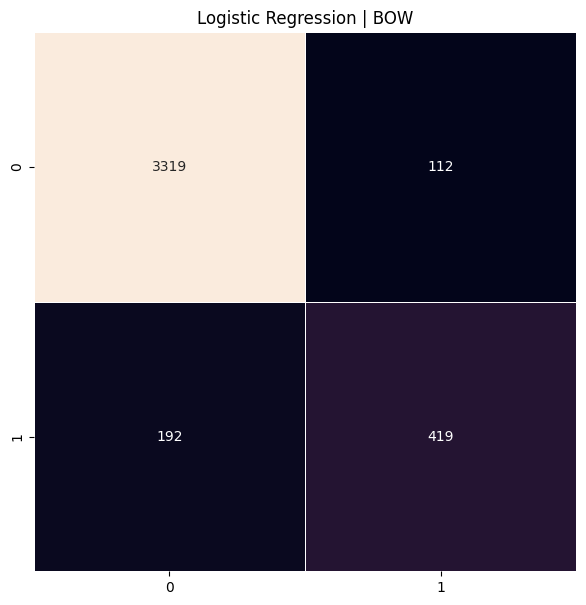

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  87.30756072528224


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1157
           1       0.70      0.70      0.70       191

    accuracy                           0.91      1348
   macro avg       0.82      0.82      0.82      1348
weighted avg       0.91      0.91      0.91      1348



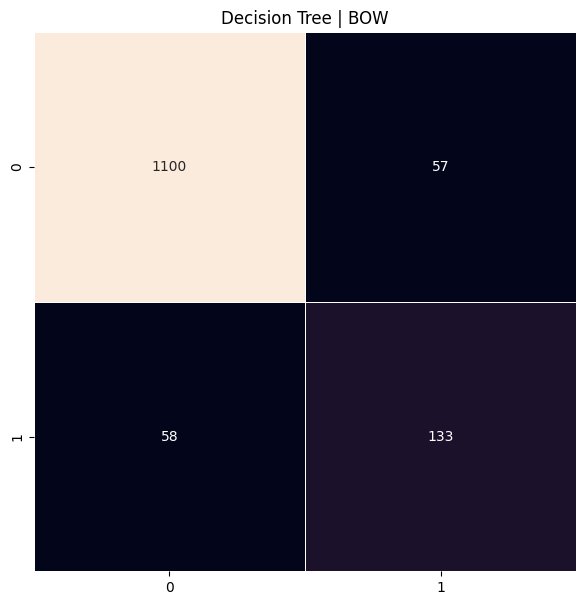

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  89.05234348272323


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.94      0.98      0.96      1157
           1       0.82      0.62      0.71       191

    accuracy                           0.93      1348
   macro avg       0.88      0.80      0.83      1348
weighted avg       0.92      0.93      0.92      1348



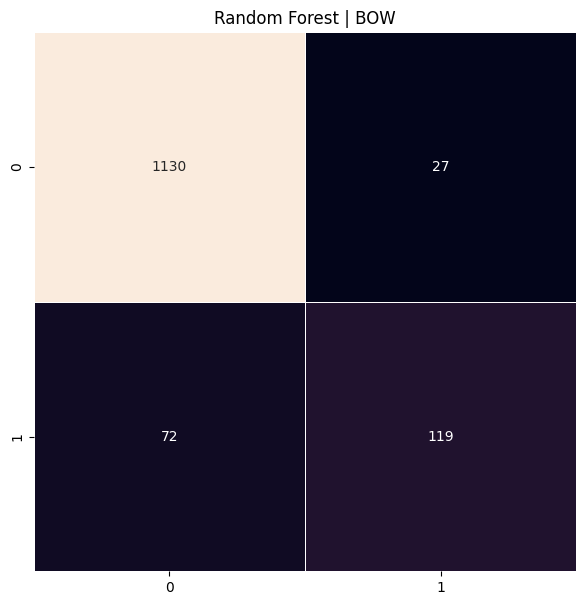

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* #### [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


###### Kütüphanelerin eklenmesi

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
data_size=data.shape[0]
data_size

9741

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data['Text'].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data['Text']), epochs=20)

(2294727, 3043100)

In [ ]:
tokenized_tweet


,Text
1,"[At, Wipro,, growth, remains, a, mirage]"
2,"[Why, Chinese, stocks, leave, US, investors, vulnerable]"
3,"[US, stocks, finish, mixed, amid, more, tech, selling]"
4,"[Opec, reduces, estimate, on, oil, demand, growth]"
5,"[Immediate, support, for, rupee, is, placed, at, 55.10:, Bonanza]"
...,...
9737,"[The, negotiations, were, carried, out, in, a, constructive, manner, ,, and, all, parties, tried, to, find, a, solution, to, the, situation, .]"
9738,"[Wockhardt, story, is, really, intriguing:, Deven, Choksey]"
9739,"[Finnish, Bore, that, is, owned, by, the, Rettig, family, has, grown, recently, through, the, acquisition, of, smaller, shipping, companies, .]"
9740,"[Operating, profit, was, EUR, 24.5, mn, ,, up, from, EUR, 23.0, mn, .]"


In [ ]:
tokenized_tweet.shape

(9741,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data['score']))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 9741


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data['Text']]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data['score']))       # 13471 olmalı


(9741, 100)
9741


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.094547,0.279811,0.193858,-0.233382,0.112209,-0.537497,0.183322,0.417718,-0.283979,-0.011278,...,0.412314,0.567743,0.264352,-0.233309,0.312784,0.115950,0.277878,-0.004448,0.158254,0.052999
1,0.097511,0.051037,0.247181,-0.237342,-0.066755,-0.335569,0.040912,0.237111,-0.180849,0.131883,...,0.529336,0.438254,0.294054,-0.127334,0.105244,0.251343,0.338166,0.037955,0.145860,0.038115
2,0.097486,0.071754,0.256461,-0.248568,-0.056456,-0.369690,0.055920,0.278346,-0.203968,0.122434,...,0.551526,0.481992,0.316725,-0.148937,0.133086,0.252630,0.351650,0.040060,0.158148,0.047510
3,0.014793,0.073347,0.360876,-0.329089,-0.133658,-0.447778,0.131079,0.349491,-0.207707,0.177522,...,0.864954,0.571951,0.468722,-0.241810,0.041543,0.268135,0.514719,0.057468,0.273962,0.206339
4,-0.007078,0.272722,0.250216,-0.281592,0.069404,-0.616258,0.185950,0.477543,-0.345691,0.021422,...,0.627579,0.621242,0.420297,-0.299314,0.221161,0.160600,0.413462,0.071477,0.268831,0.181624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9736,0.112393,0.541154,0.252457,-0.334726,0.197483,-0.829587,0.357309,0.655879,-0.470139,-0.150492,...,0.554115,0.854233,0.429105,-0.393860,0.556680,0.138800,0.376157,-0.021720,0.256300,0.067881
9737,0.103739,0.042862,0.190071,-0.185282,0.018036,-0.299188,0.007771,0.232593,-0.165725,0.062788,...,0.381378,0.403186,0.229216,-0.111914,0.151011,0.226123,0.248867,0.005301,0.104057,0.008285
9738,0.176533,0.305563,0.268938,-0.349100,0.210901,-0.712421,0.123848,0.585718,-0.413487,-0.056302,...,0.573317,0.781656,0.347299,-0.266881,0.465845,0.280756,0.305771,-0.092496,0.188465,-0.021063
9739,-0.153344,1.635948,0.265793,-0.293978,0.320256,-1.421407,1.221379,1.069148,-0.769514,-0.530680,...,0.866166,1.256398,0.753103,-0.917326,0.927136,-0.319206,0.618703,0.189261,0.616551,0.601492


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score2'],random_state=42,test_size=0.3)


NameError: name 'wordvec_df' is not defined

In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
9119    1
2312    0
2154    0
7895    1
1427    0
Name: score2, dtype: int64


In [ ]:
yvalid.head()

,score2
3312,0
3668,0
7535,1
5225,1
9617,1


In [ ]:
yvalid.shape

(2923,)

In [ ]:
ytrain

,score2
9119,1
2312,0
2154,0
7895,1
1427,0
...,...
5734,1
5191,1
5390,1
860,0


In [ ]:
ytrain.shape

(6818,)

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  58.46732808758125


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.6780743782797171


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.84      0.02      0.04      1432
           1       0.51      1.00      0.68      1491

    accuracy                           0.52      2923
   macro avg       0.68      0.51      0.36      2923
weighted avg       0.67      0.52      0.36      2923



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.36329355199868624

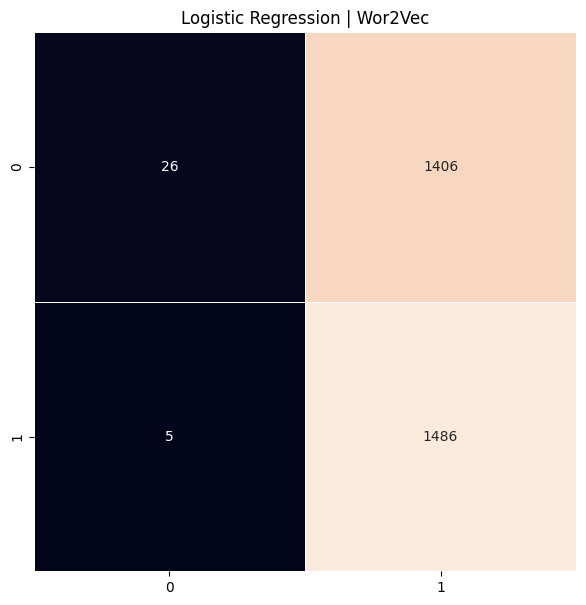

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,ytrain)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  60.75949367088608


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6787767302828236

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.37896479215997964

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.77      0.03      0.07      1432
           1       0.52      0.99      0.68      1491

    accuracy                           0.52      2923
   macro avg       0.64      0.51      0.37      2923
weighted avg       0.64      0.52      0.38      2923



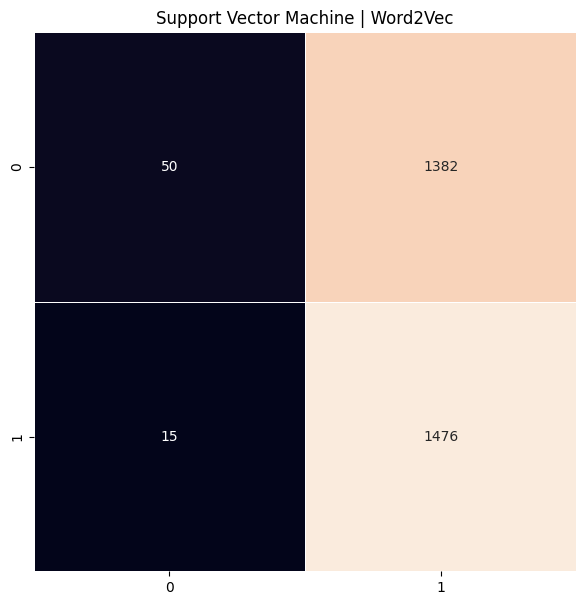

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  66.47280191583988


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.6809939556749496

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.6749998188428321

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.67      0.67      0.67      1432
           1       0.68      0.68      0.68      1491

    accuracy                           0.67      2923
   macro avg       0.67      0.67      0.67      2923
weighted avg       0.68      0.67      0.67      2923



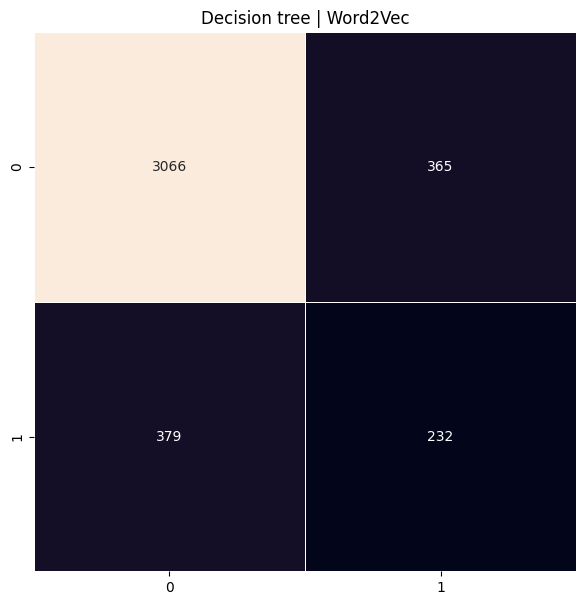

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  69.8255217242559


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.6967608545830462

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.68      0.72      0.70      1432
           1       0.72      0.68      0.70      1491

    accuracy                           0.70      2923
   macro avg       0.70      0.70      0.70      2923
weighted avg       0.70      0.70      0.70      2923



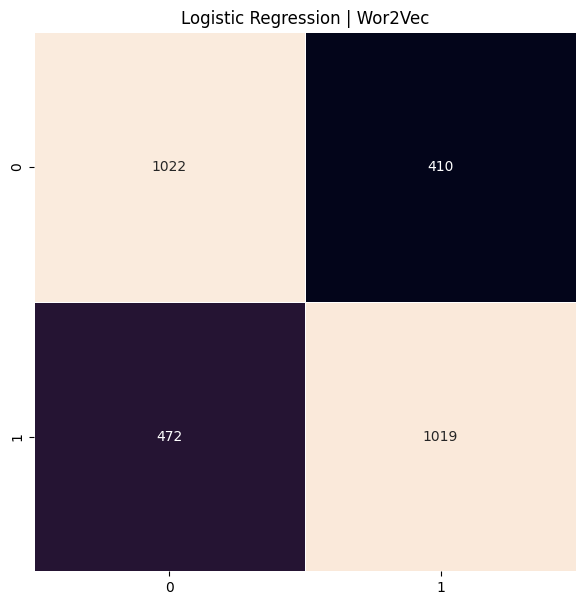

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, predictions_rf_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8388432100155488

* #### [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0


In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
train_df["Text_prepro"]=train_df["Text"].apply(preprocess_data)

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

In [ ]:
X=train_df.drop(["Text","oh_label"],axis=1)
y=train_df["oh_label"]

In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
y

,oh_label
1,0
2,0
3,0
4,0
5,0
...,...
9737,2
9738,2
9739,2
9740,2


In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in df["Text_prepro"]]

In [ ]:
df["Text_prepro"]=df["Text"]

In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in df['Text_prepro']]

In [ ]:
len(tokenized_documents)

9741

In [ ]:
tokenized_documents[0]

['At', 'Wipro', ',', 'growth', 'remains', 'a', 'mirage']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=16530, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
, : 0
to : 1
. : 2
the : 3
in : 4
of : 5
: : 6
$ : 7
on : 8
% : 9
a : 10
EUR : 11
and : 12
for : 13
from : 14
# : 15
net : 16
profit : 17
mn : 18
's : 19
Rs : 20
as : 21
by : 22
; : 23
at : 24
up : 25
stocks : 26
down : 27
( : 28
sales : 29
) : 30
The : 31
crore : 32
million : 33
with : 34
Finnish : 35
its : 36
company : 37
quarter : 38
period : 39
year : 40
loss : 41
said : 42
shares : 43
@ : 44
is : 45
per : 46
mln : 47
https : 48
over : 49


In [ ]:
max_length = train_df['Text_prepro'].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

58

In [ ]:
max_length_index = train_df['Text_prepro'].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 7945


In [ ]:
train_df.at[max_length_index, 'Text_prepro']

'Boohoo, Manchester fashion giant, sees revenue soar to Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â£1.2bn as profit tops Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â£92m Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¢Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x80Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x93 Northern Financial Review\n\nÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¢Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x81Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¦@boohooÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¢Ã\x83Â\x83Ã\x82Â\x83

In [ ]:
train_df.at[max_length_index, 'Text']

'Boohoo, Manchester fashion giant, sees revenue soar to Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â£1.2bn as profit tops Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â£92m Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¢Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x80Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x93 Northern Financial Review\n\nÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¢Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x81Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¦@boohooÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â¢Ã\x83Â\x83Ã\x82Â\x83

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in df['Text_prepro']]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in df['Text_prepro']]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in df['Text_prepro']]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


NameError: name 'pad_sequences' is not defined

In [ ]:
len(sequences)

9741

In [ ]:
sequences[0]

[571, 641, 0, 103, 1045, 10, 8593]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(9741, 58)

In [ ]:
y = np.asarray(train_df['score'])

In [ ]:
jumlah_kelas=len(train_df["score"].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train_int, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

ValueError: Unrecognized data type: x=[[ 3271    67    17 ...     0     0     0]
 [ 4570  4569   190 ...     0     0     0]
 [10212  3195     4 ...     0     0     0]
 ...
 [ 1918    67   209 ...     0     0     0]
 [ 3800  1612    67 ...     0     0     0]
 [  815   180     1 ...     0     0     0]] (of type <class 'numpy.ndarray'>)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 13s 353ms/step - accuracy: 0.5065 - loss: 0.6927 - val_accuracy: 0.5135 - val_loss: 0.6892
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 254ms/step - accuracy: 0.5381 - loss: 0.6879 - val_accuracy: 0.5929 - val_loss: 0.6823
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 254ms/step - accuracy: 0.5702 - loss: 0.6805 - val_accuracy: 0.6079 - val_loss: 0.6775
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 289ms/step - accuracy: 0.6265 - loss: 0.6655 - val_accuracy: 0.6439 - val_loss: 0.6404
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 329ms/step - accuracy: 0.6210 - loss: 0.6540 - val_accuracy: 0.6291 - val_loss: 0.6505
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 308ms/step - accuracy: 0.6318 - loss: 0.6421 - val_accuracy: 0.6452 - val_loss: 0.6315
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 257ms/step - accuracy: 0.6633 - loss: 0.6182 - val_accuracy: 0.6603 - val_loss: 0.6207
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 287ms/step - accuracy: 0.6655 - loss: 0.6083 - va

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 78.07%


In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_2', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 8825, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[ 0.01895848 -0.02662688  0.01187607 ... -0.02470404 -0.01898459
   0.0188369 ]
 [ 0.03005118  0.00617456 -0.00252767 ... -0.04055096  0.04308108
   0.00271726]
 [ 0.03386542 -0.00798277  0.01233403 ... -0.01663148  0.01816651
  -0.03122828]
 ...
 [-0.01556333 -0.04694396 -0.0092114  ... -0.03917712  0.03134291
  -0.01025982]
 [-0.03966453  0.03487326 -0.00078491 ...  0.01101984  0.01993254
  -0.0090547 ]
 [ 0.04715239 -0.00373975 -0.04836649 ...  0.03530875  0.01676147
  -0.02759295]]


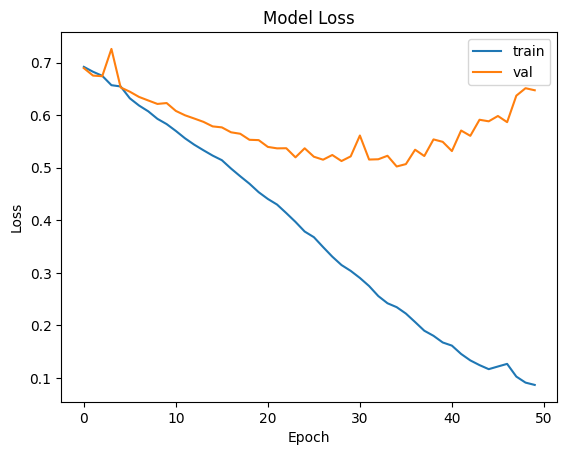

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

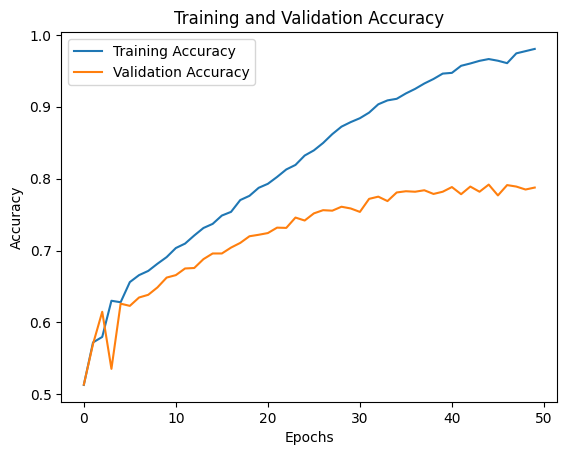

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 50, 100)        │       882,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 50, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,162,873 (4.44 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 882,500 (3.37 MB)

 Optimizer params: 186,916 (730.14 KB)

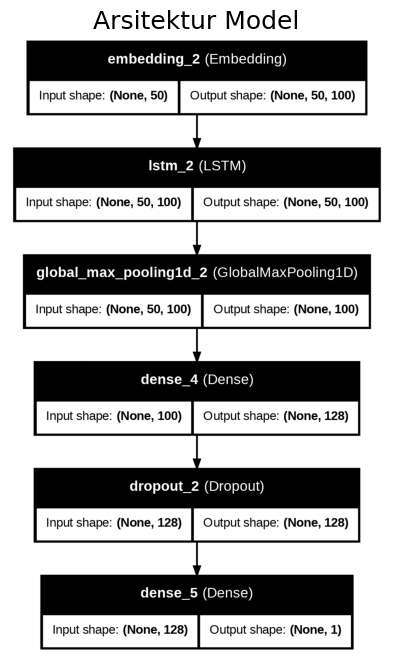

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



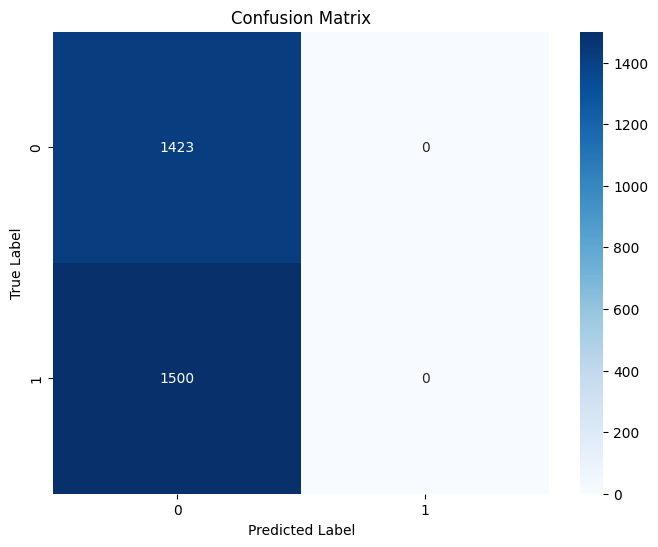

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

# [2. Hibrit Sütununa göre](#b1)

* #### [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Mounted at /content/drive
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'

df = pd.read_csv(file_path4, encoding='latin1', header=None)
#df = pd.read_csv(file_path4, index_col=0)

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
df.columns=['Text','tokens', 'text_length', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPLSTMPrePRro',
       'score', 'oh_label']

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
#df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df=df.drop(df.index[0])

In [ ]:
df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,finnish bore own rettig famili grown recent acquisit smaller ship compani,1,2,1
9740,"Operating prof

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df['score']

,score
1,-1
2,-1
3,-1
4,-1
5,-1
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
df['score2']

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


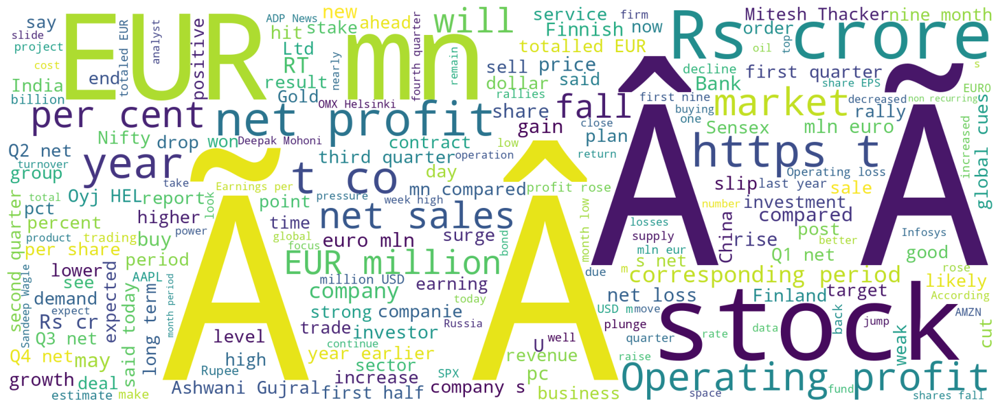

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
#secilen_kolon_adi='USAirPrePro2'
secilen_kolon_adi='hibrit'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df['score2']


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name='score2')


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=df[[secilen_kolon_adi,'score2']]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data.head()

,hibrit,score2
1,wipro growth remains mirage,0
2,chinese stocks leave us investors vulnerable,0
3,us stocks finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0


In [ ]:
X_df.head()

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza


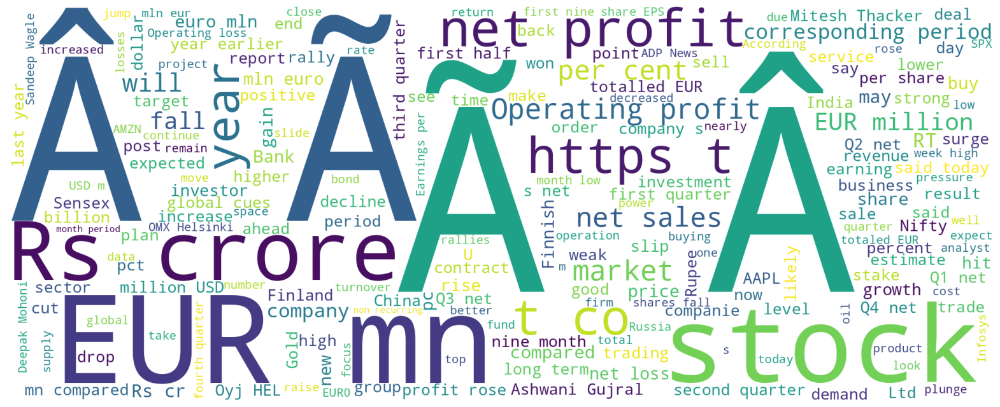

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

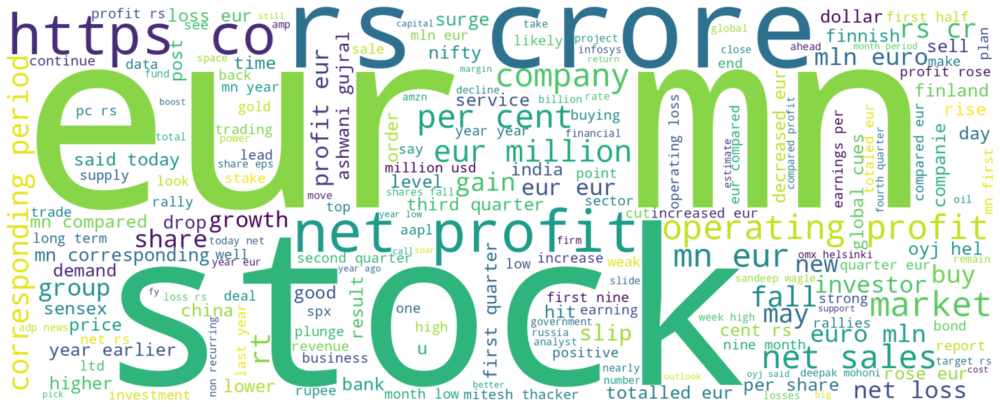

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
x = df[secilen_kolon_adi]
x

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
y = df['score2']
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
x

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


######  [keşifsel veri analizi için deneme](#b1)


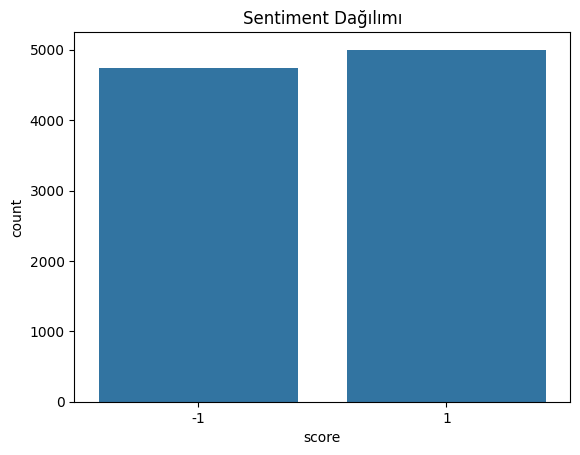

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

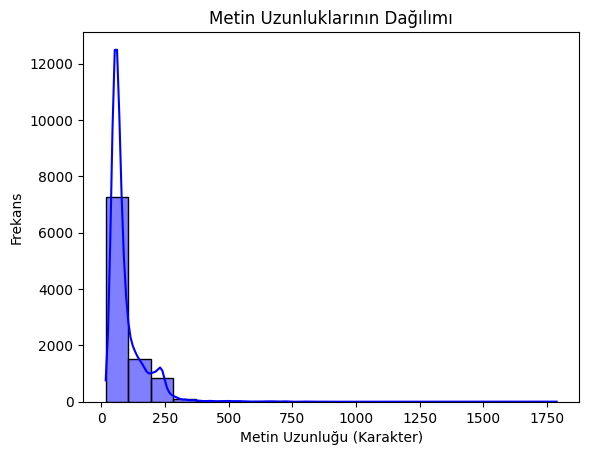

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

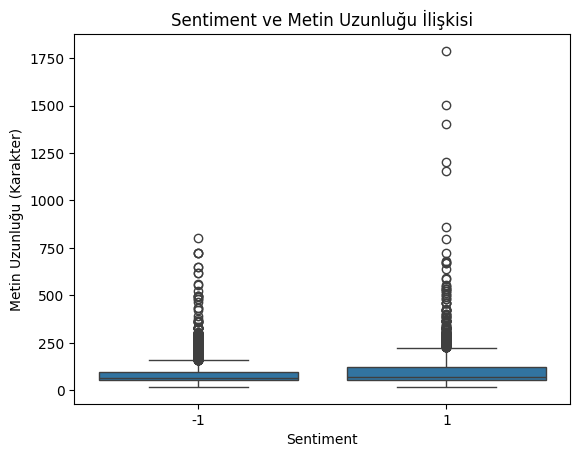

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

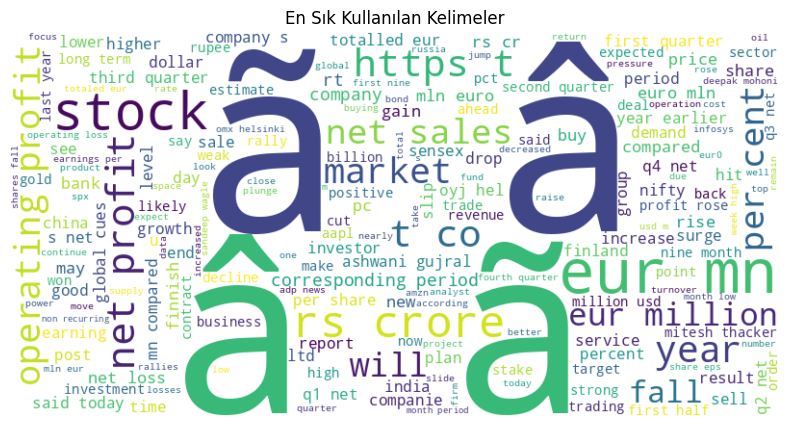

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == 1]['Text']).lower()
negative_text = " ".join(df[df['score'] == -1]['Text']).lower()
neutral_text = " ".join(df[df['score'] == 0]['Text']).lower()

In [ ]:
positive_text

'euronext to list first on french, dutch, belgian exchanges glaxosmithkline consumer hits 52-week high on expansion plans snowmans ipo gets overwhelming response, subscribing 60 times small investors find merit in beaten-down midcaps like kfa, suzlon energy, lanco infra jyothy labs q3 net up by 27.9 per cent edelweiss maintains buy on irb infrastructure `` the number of collection errors fell considerably , and operations speeded up .  4 february 2011 - finnish broadband data communication systems provider teleste oyj hel : tlt1v saw its net profit jump to eur2 .1 m for the last quarter of 2010 from eur995 ,000 for the same period of 2009 .  outotec oyj press release , february 19 , 2008 at 11.00 am outotec has won two large minerals processing technology orders from mirabela mineracao do brasil ltda , brazil and from cumerio med jsco , bulgaria .  sensex hits record all-time high; nifty races past 7,600 finnish kci konecranes has been awarded an order for four hot metal ladle cranes b

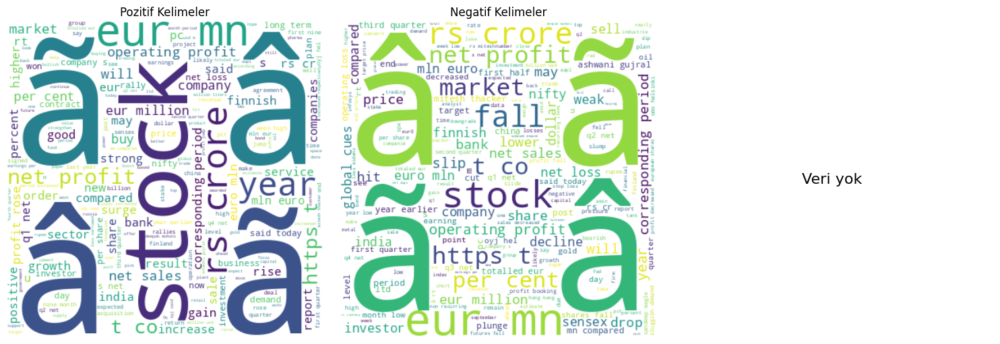

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


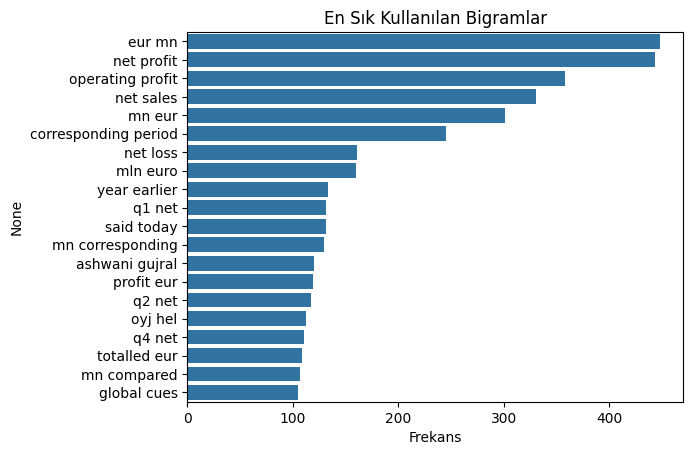

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df['Text'])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* #### [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

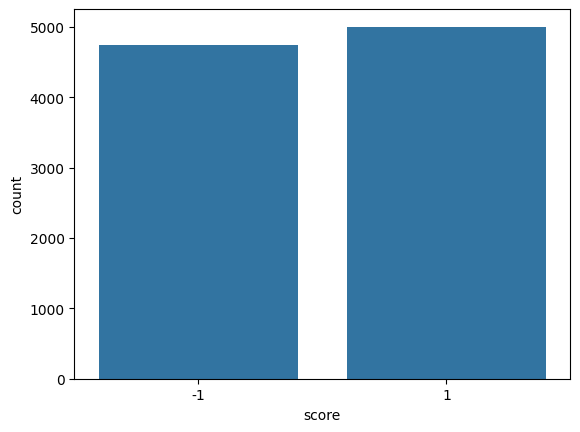

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(6818, 9227) (2923, 9227)


In [ ]:
print(test_vectors)

  (0, 290)	0.32261823603815504
  (0, 329)	0.24576170926599258
  (0, 941)	0.34043360450552257
  (0, 1005)	0.335258441125339
  (0, 1465)	0.1864720784520835
  (0, 1692)	0.32261823603815504
  (0, 1985)	0.19706828221074324
  (0, 3537)	0.20512121206898515
  (0, 3650)	0.18850035108706784
  (0, 3987)	0.38352938314725815
  (0, 5327)	0.21374233703079756
  (0, 6906)	0.19966636534512
  (0, 7919)	0.2490668838418679
  (0, 8275)	0.23926237906874917
  (1, 1651)	0.29679124437103216
  (1, 1940)	0.22984609961780117
  (1, 2571)	0.27261422587348727
  (1, 2888)	0.17589733914961514
  (1, 3495)	0.3479631284980553
  (1, 5075)	0.3343699420282496
  (1, 5317)	0.1366613337332085
  (1, 5582)	0.24236309173066295
  (1, 6018)	0.3690709463072085
  (1, 6988)	0.16779050698165165
  (1, 7898)	0.31154433044047236
  :	:
  (2920, 3239)	0.3910705037420336
  (2920, 5831)	0.42190435931902315
  (2920, 8914)	0.4226558794741499
  (2921, 144)	0.3102178683693159
  (2921, 146)	0.49873302729482155
  (2921, 290)	0.24936651364741078
  (2


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  84.0574751967157


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

           0       0.84      0.84      0.84      1432
           1       0.84      0.84      0.84      1491

    accuracy                           0.84      2923
   macro avg       0.84      0.84      0.84      2923
weighted avg       0.84      0.84      0.84      2923



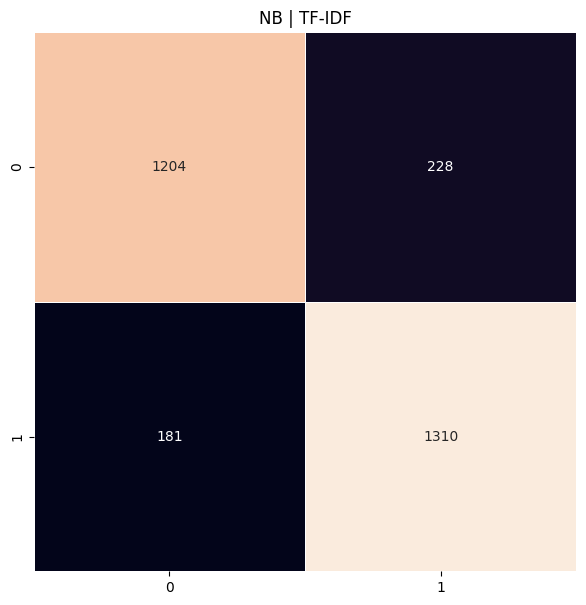

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

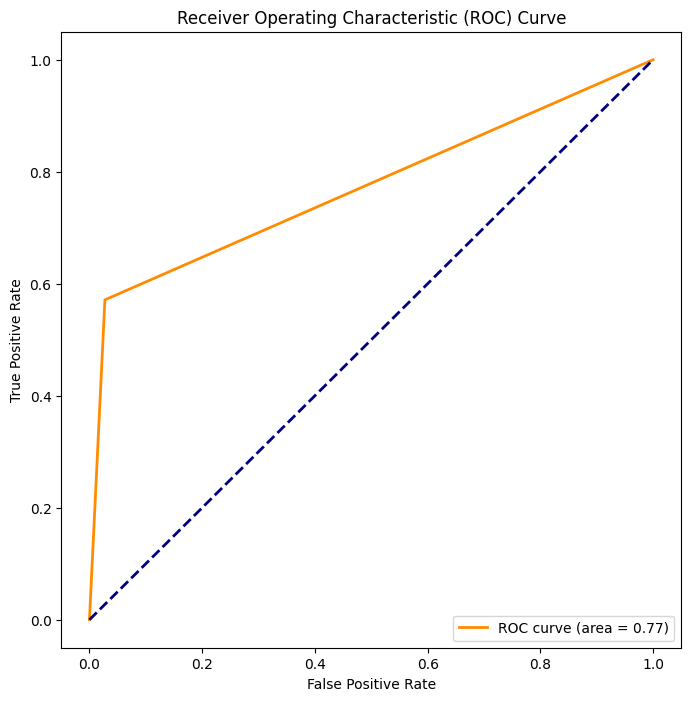

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  86.58912076633595


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.91      0.89      0.90      1432
           1       0.89      0.92      0.90      1491

    accuracy                           0.90      2923
   macro avg       0.90      0.90      0.90      2923
weighted avg       0.90      0.90      0.90      2923



In [ ]:
y_test.head(500)

,score
4464,0
3290,0
8420,0
7608,0
6867,0
...,...
6428,0
1635,0
9594,0
10913,0


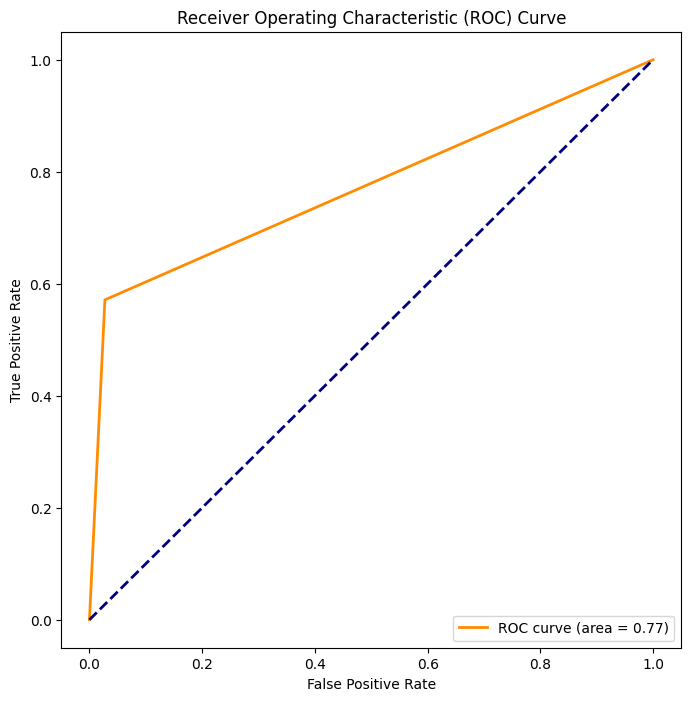

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


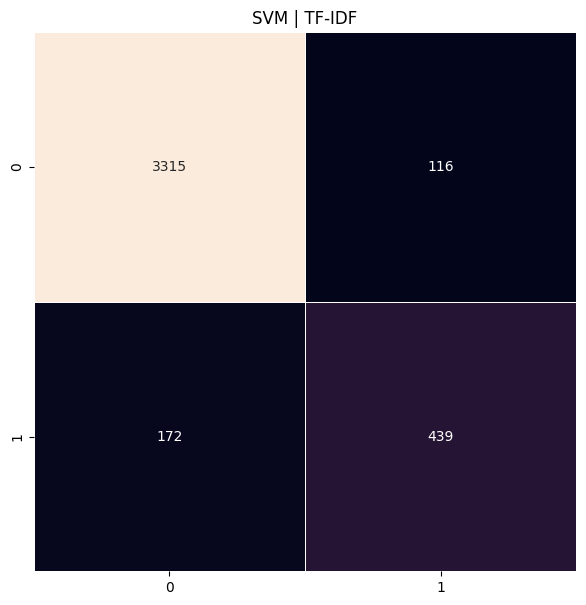

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  85.76804652754019


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      3431
           1       0.79      0.57      0.66       611

    accuracy                           0.91      4042
   macro avg       0.86      0.77      0.81      4042
weighted avg       0.91      0.91      0.91      4042



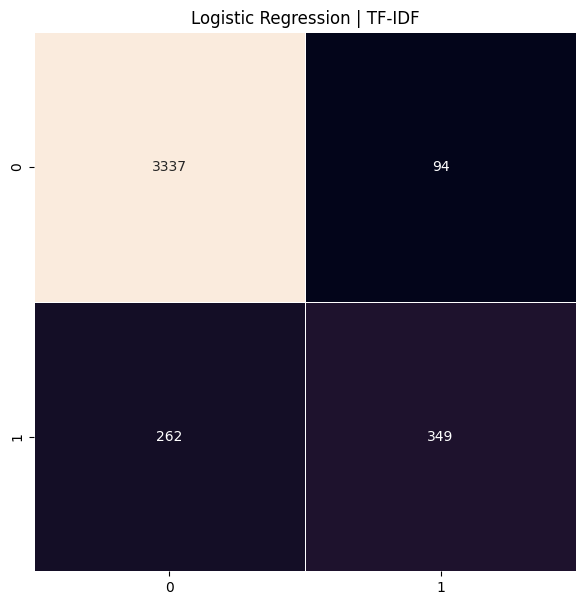

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score
4464,0
3290,0
8420,0
7608,0
6867,0
...,...
186,0
3754,0
7975,0
9469,0


In [ ]:
predictions_log

AttributeError: 'numpy.ndarray' object has no attribute 'head'

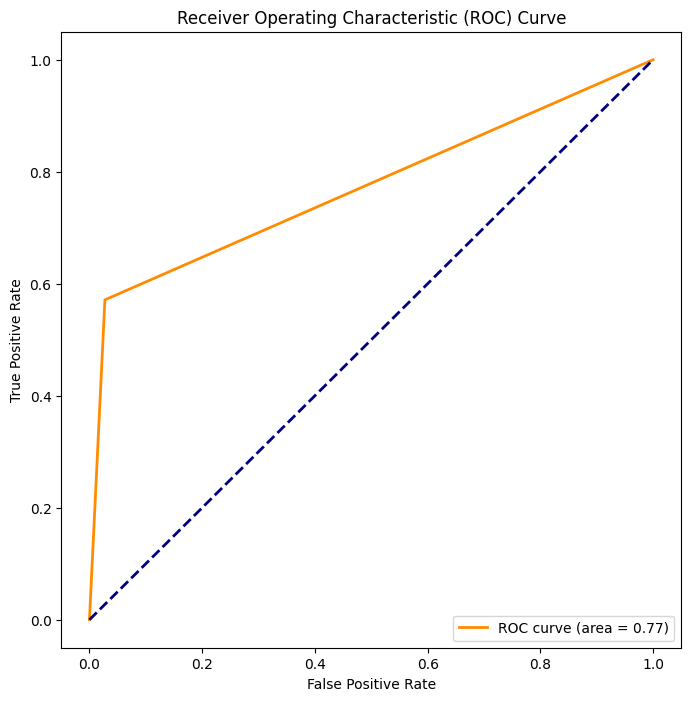

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_test = y_test.astype(int)
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  72.8703386931235


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.87      1.00      0.93      1157
           1       0.92      0.06      0.12       191

    accuracy                           0.87      1348
   macro avg       0.89      0.53      0.52      1348
weighted avg       0.87      0.87      0.81      1348



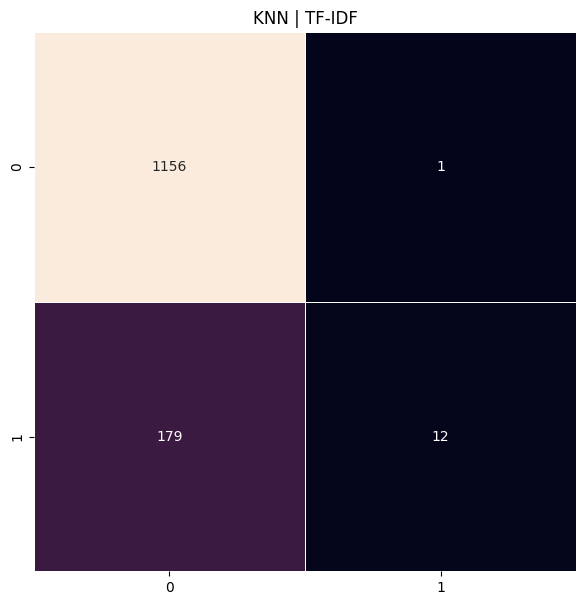

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

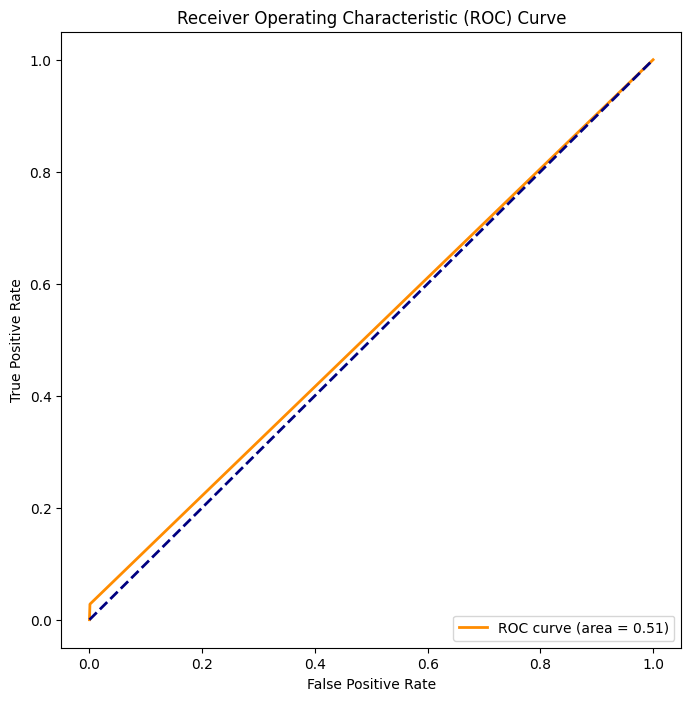

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_test = y_test.astype(int)
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  82.14163530619227


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.95      0.94      0.95      3431
           1       0.70      0.71      0.70       611

    accuracy                           0.91      4042
   macro avg       0.82      0.83      0.82      4042
weighted avg       0.91      0.91      0.91      4042



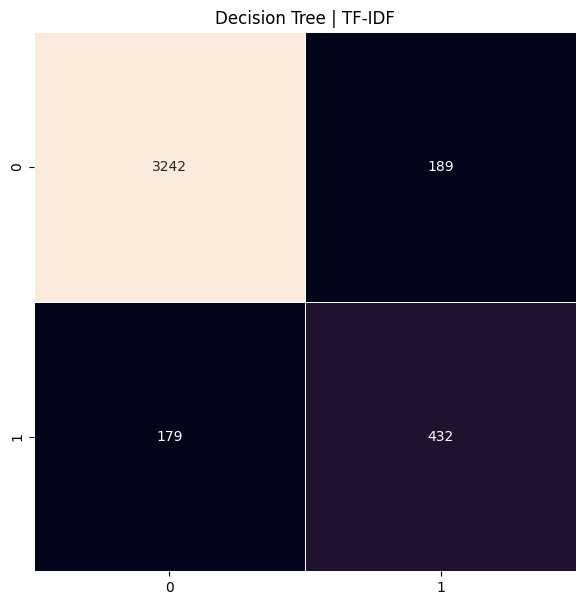

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_test = y_test.astype(int)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  85.90489223400616


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.94      0.97      0.96      3431
           1       0.82      0.63      0.71       611

    accuracy                           0.92      4042
   macro avg       0.88      0.80      0.83      4042
weighted avg       0.92      0.92      0.92      4042



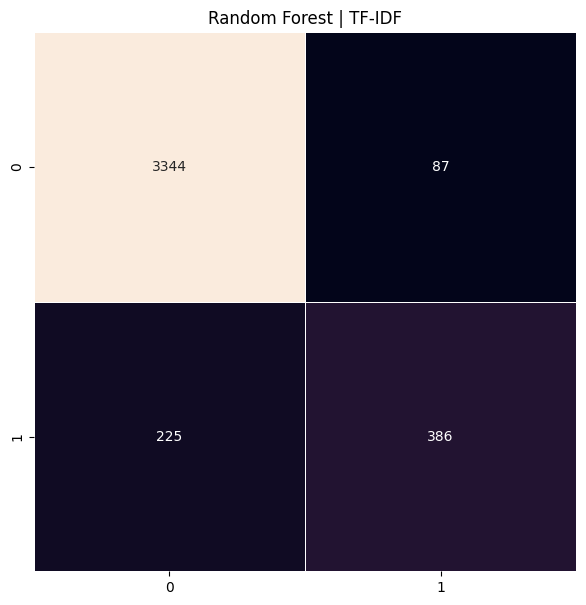

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* #### [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

######Kütüphanelerin yüklenmesi ve test setinin oluşturulması

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(6818, 9227) (2923, 9227)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  84.60485802257955


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.82      0.87      0.85      1432
           1       0.87      0.82      0.84      1491

    accuracy                           0.85      2923
   macro avg       0.85      0.85      0.85      2923
weighted avg       0.85      0.85      0.85      2923



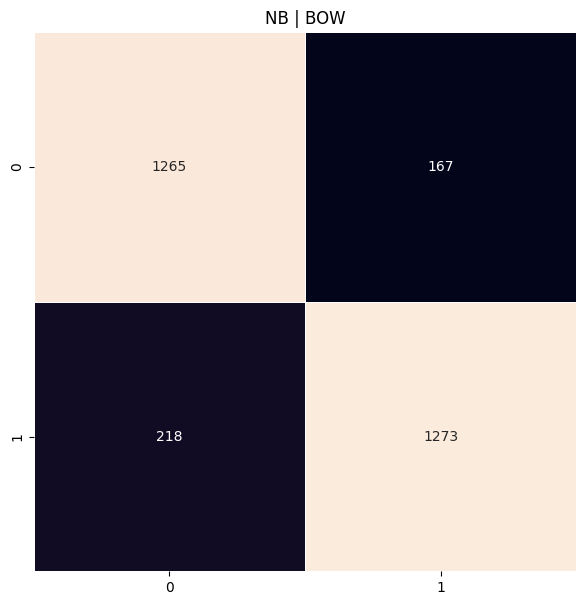

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  85.42593226137531


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      3431
           1       0.74      0.72      0.73       611

    accuracy                           0.92      4042
   macro avg       0.84      0.84      0.84      4042
weighted avg       0.92      0.92      0.92      4042



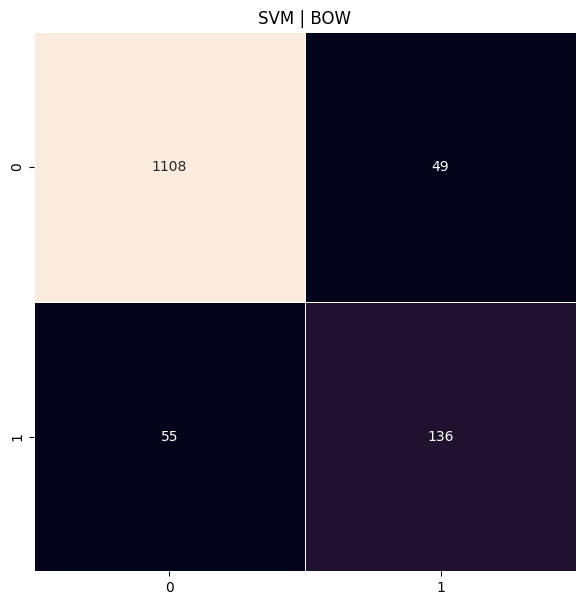

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  86.14437222032159


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      3431
           1       0.79      0.69      0.73       611

    accuracy                           0.92      4042
   macro avg       0.87      0.83      0.85      4042
weighted avg       0.92      0.92      0.92      4042



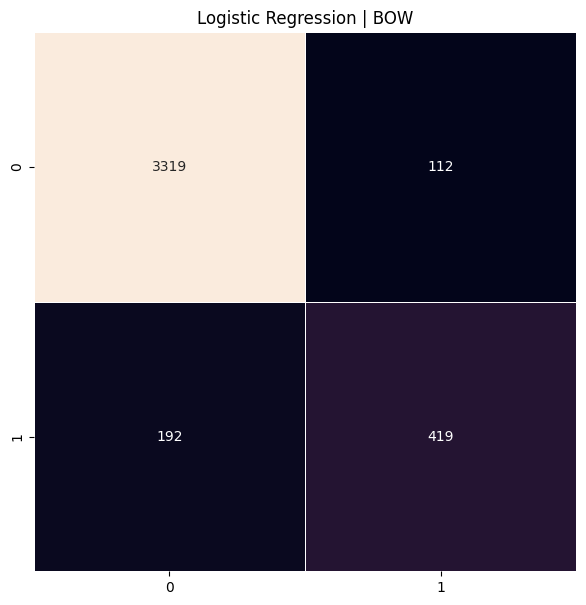

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  82.7574409852891


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1157
           1       0.70      0.70      0.70       191

    accuracy                           0.91      1348
   macro avg       0.82      0.82      0.82      1348
weighted avg       0.91      0.91      0.91      1348



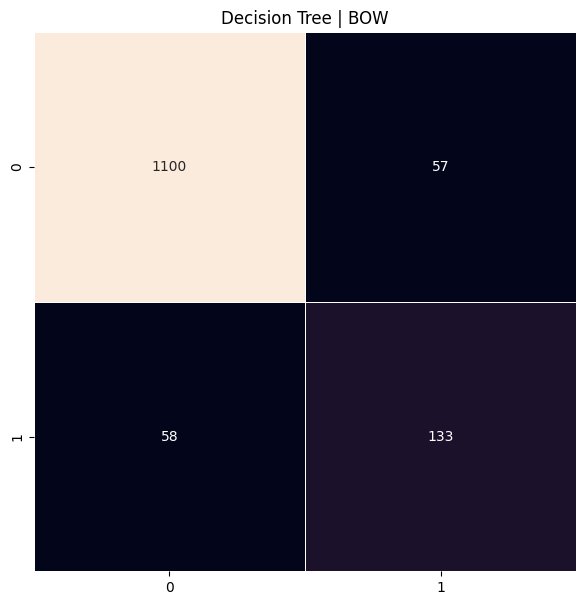

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  86.28121792678755


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.89      0.82      0.85      1432
           1       0.84      0.90      0.87      1491

    accuracy                           0.86      2923
   macro avg       0.87      0.86      0.86      2923
weighted avg       0.86      0.86      0.86      2923



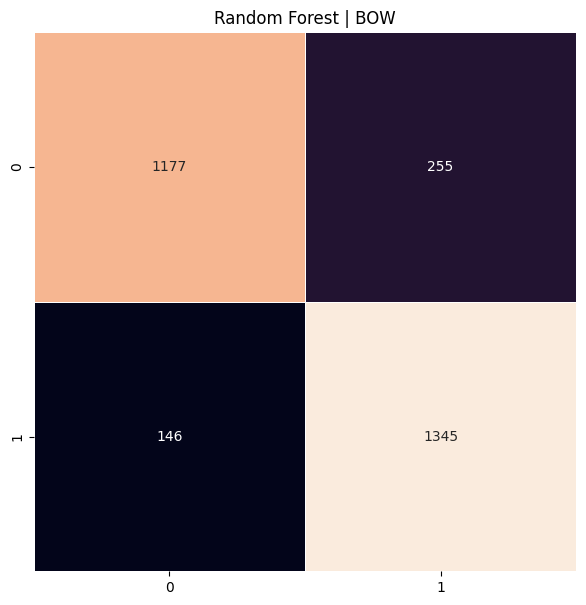

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* #### [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


###### Kütüphanelerin eklenmesi

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
data_size=data.shape[0]
data_size

9741

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data['Text'].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data['Text']), epochs=20)

(2294727, 3043100)

In [ ]:
tokenized_tweet


,Text
1,"[At, Wipro,, growth, remains, a, mirage]"
2,"[Why, Chinese, stocks, leave, US, investors, vulnerable]"
3,"[US, stocks, finish, mixed, amid, more, tech, selling]"
4,"[Opec, reduces, estimate, on, oil, demand, growth]"
5,"[Immediate, support, for, rupee, is, placed, at, 55.10:, Bonanza]"
...,...
9737,"[The, negotiations, were, carried, out, in, a, constructive, manner, ,, and, all, parties, tried, to, find, a, solution, to, the, situation, .]"
9738,"[Wockhardt, story, is, really, intriguing:, Deven, Choksey]"
9739,"[Finnish, Bore, that, is, owned, by, the, Rettig, family, has, grown, recently, through, the, acquisition, of, smaller, shipping, companies, .]"
9740,"[Operating, profit, was, EUR, 24.5, mn, ,, up, from, EUR, 23.0, mn, .]"


In [ ]:
tokenized_tweet.shape

(9741,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data['score']))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 9741


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data['Text']]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data['score']))       # 13471 olmalı


(9741, 100)
9741


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.094547,0.279811,0.193858,-0.233382,0.112209,-0.537497,0.183322,0.417718,-0.283979,-0.011278,...,0.412314,0.567743,0.264352,-0.233309,0.312784,0.115950,0.277878,-0.004448,0.158254,0.052999
1,0.097511,0.051037,0.247181,-0.237342,-0.066755,-0.335569,0.040912,0.237111,-0.180849,0.131883,...,0.529336,0.438254,0.294054,-0.127334,0.105244,0.251343,0.338166,0.037955,0.145860,0.038115
2,0.097486,0.071754,0.256461,-0.248568,-0.056456,-0.369690,0.055920,0.278346,-0.203968,0.122434,...,0.551526,0.481992,0.316725,-0.148937,0.133086,0.252630,0.351650,0.040060,0.158148,0.047510
3,0.014793,0.073347,0.360876,-0.329089,-0.133658,-0.447778,0.131079,0.349491,-0.207707,0.177522,...,0.864954,0.571951,0.468722,-0.241810,0.041543,0.268135,0.514719,0.057468,0.273962,0.206339
4,-0.007078,0.272722,0.250216,-0.281592,0.069404,-0.616258,0.185950,0.477543,-0.345691,0.021422,...,0.627579,0.621242,0.420297,-0.299314,0.221161,0.160600,0.413462,0.071477,0.268831,0.181624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9736,0.112393,0.541154,0.252457,-0.334726,0.197483,-0.829587,0.357309,0.655879,-0.470139,-0.150492,...,0.554115,0.854233,0.429105,-0.393860,0.556680,0.138800,0.376157,-0.021720,0.256300,0.067881
9737,0.103739,0.042862,0.190071,-0.185282,0.018036,-0.299188,0.007771,0.232593,-0.165725,0.062788,...,0.381378,0.403186,0.229216,-0.111914,0.151011,0.226123,0.248867,0.005301,0.104057,0.008285
9738,0.176533,0.305563,0.268938,-0.349100,0.210901,-0.712421,0.123848,0.585718,-0.413487,-0.056302,...,0.573317,0.781656,0.347299,-0.266881,0.465845,0.280756,0.305771,-0.092496,0.188465,-0.021063
9739,-0.153344,1.635948,0.265793,-0.293978,0.320256,-1.421407,1.221379,1.069148,-0.769514,-0.530680,...,0.866166,1.256398,0.753103,-0.917326,0.927136,-0.319206,0.618703,0.189261,0.616551,0.601492


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score2'],random_state=42,test_size=0.3)


NameError: name 'wordvec_df' is not defined

In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
9119    1
2312    0
2154    0
7895    1
1427    0
Name: score2, dtype: int64


In [ ]:
yvalid.head()

,score2
3312,0
3668,0
7535,1
5225,1
9617,1


In [ ]:
yvalid.shape

(2923,)

In [ ]:
ytrain

,score2
9119,1
2312,0
2154,0
7895,1
1427,0
...,...
5734,1
5191,1
5390,1
860,0


In [ ]:
ytrain.shape

(6818,)

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  58.46732808758125


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.6780743782797171


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.84      0.02      0.04      1432
           1       0.51      1.00      0.68      1491

    accuracy                           0.52      2923
   macro avg       0.68      0.51      0.36      2923
weighted avg       0.67      0.52      0.36      2923



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.36329355199868624

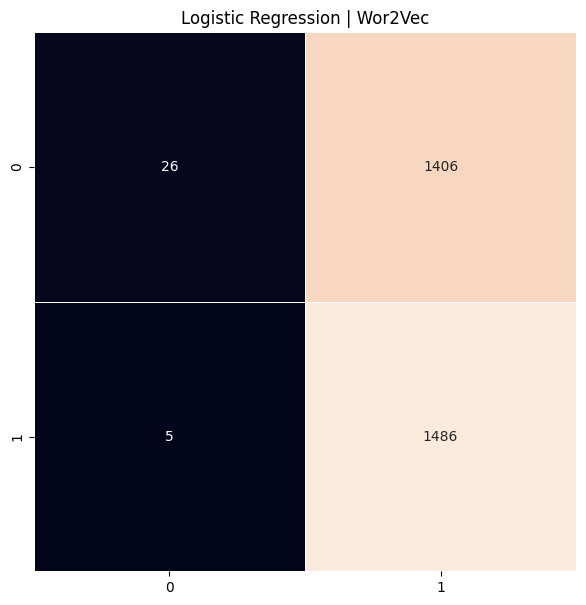

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,ytrain)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  60.75949367088608


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6787767302828236

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.37896479215997964

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.77      0.03      0.07      1432
           1       0.52      0.99      0.68      1491

    accuracy                           0.52      2923
   macro avg       0.64      0.51      0.37      2923
weighted avg       0.64      0.52      0.38      2923



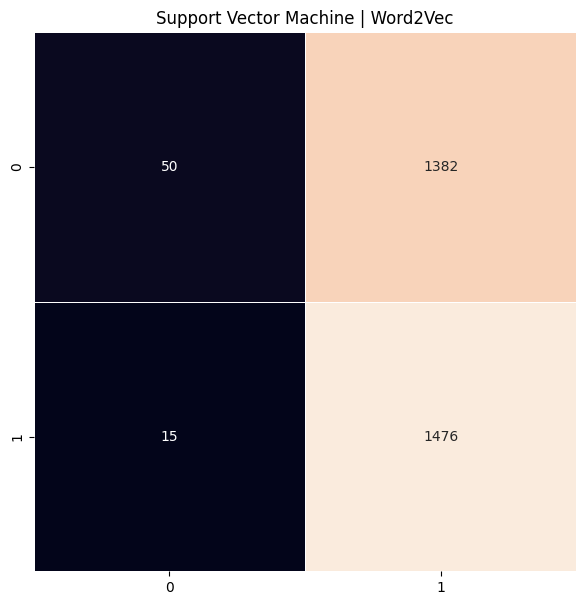

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  66.47280191583988


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.6809939556749496

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.6749998188428321

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.67      0.67      0.67      1432
           1       0.68      0.68      0.68      1491

    accuracy                           0.67      2923
   macro avg       0.67      0.67      0.67      2923
weighted avg       0.68      0.67      0.67      2923



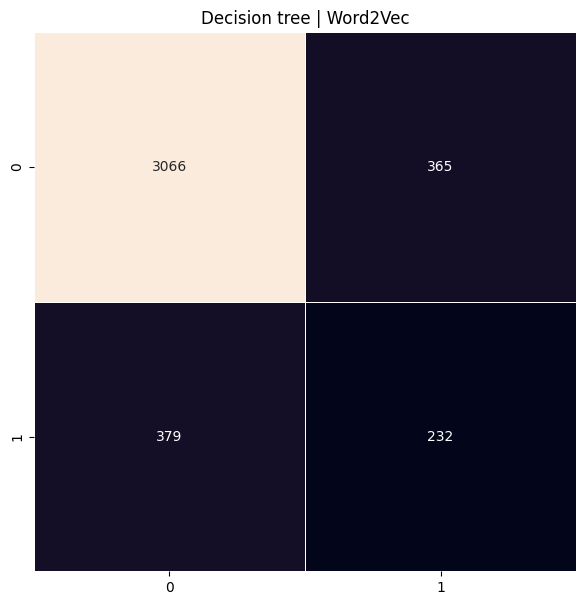

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  69.8255217242559


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.6967608545830462

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.68      0.72      0.70      1432
           1       0.72      0.68      0.70      1491

    accuracy                           0.70      2923
   macro avg       0.70      0.70      0.70      2923
weighted avg       0.70      0.70      0.70      2923



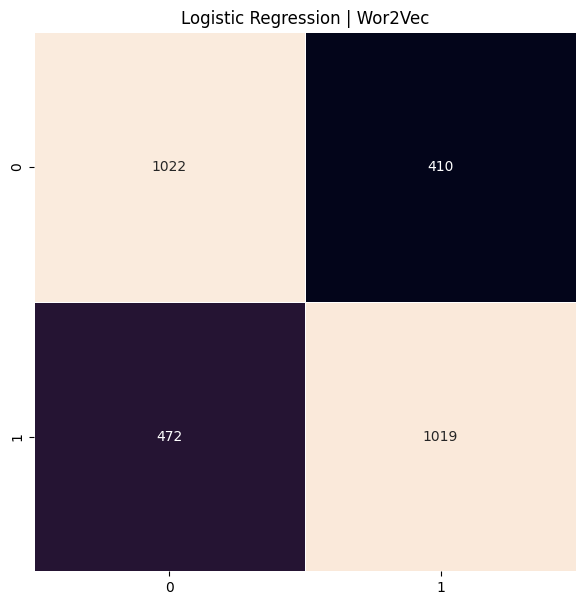

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, predictions_rf_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8388432100155488

* #### [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Datanın incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
train_df["Text_prepro"]=train_df["Text"].apply(preprocess_data)

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
secilen_kolon_adi="hibrit"

In [ ]:
secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score2
1,wipro growth remains mirage,0
2,chinese stocks leave us investors vulnerable,0
3,us stocks finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiations carried constructive manner parties tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies,1
9740,operating profit eur mn eur mn,1


,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

9741

In [ ]:
tokenized_documents[0]

['wipro', 'growth', 'remains', 'mirage']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=10790, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
eur : 0
net : 1
profit : 2
mn : 3
rs : 4
stocks : 5
year : 6
sales : 7
crore : 8
million : 9
quarter : 10
company : 11
finnish : 12
shares : 13
operating : 14
period : 15
loss : 16
said : 17
per : 18
co : 19
https : 20
mln : 21
stock : 22
bank : 23
market : 24
cent : 25
euro : 26
first : 27
compared : 28
demand : 29
rt : 30
oyj : 31
fall : 32
group : 33
india : 34
futures : 35
oil : 36
corresponding : 37
high : 38
share : 39
nifty : 40
may : 41
prices : 42
global : 43
us : 44
cr : 45
today : 46
new : 47
increased : 48
month : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

53

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 3385


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'european stocks push higher trade war threats recede https co iybgwmahhv trading tradingview forex eurusd investing investor entrepreneur stocks forexlifestyle wallstreet forexsignals business forextrader technicalanalysis millionaire billionaire https co rdzdsegyq'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'european stocks push higher trade war threats recede https co iybgwmahhv trading tradingview forex eurusd investing investor entrepreneur stocks forexlifestyle wallstreet forexsignals business forextrader technicalanalysis millionaire billionaire https co rdzdsegyq'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


NameError: name 'pad_sequences' is not defined

In [ ]:
len(sequences)

9741

In [ ]:
sequences[0]

[534, 52, 861, 6075]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(9741, 53)

In [ ]:
y = np.asarray(df['score2'])

In [ ]:
jumlah_kelas=len(df['score2'].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
padded_sequences

array([[ 534,   52,  861, ...,    0,    0,    0],
       [ 994,    5, 4933, ...,    0,    0,    0],
       [  44,    5, 4901, ...,    0,    0,    0],
       ...,
       [  12, 4086, 1058, ...,    0,    0,    0],
       [  14,    2,    0, ...,    0,    0,    0],
       [ 547, 1601,  348, ...,    0,    0,    0]], dtype=int32)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train_int, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

ValueError: Unrecognized data type: x=[[2634   23    2 ...    0    0    0]
 [4378 4377  130 ...    0    0    0]
 [5789 2407 2850 ...    0    0    0]
 ...
 [1524   23  361 ...    0    0    0]
 [2996  685   23 ...    0    0    0]
 [ 688  122  383 ...    0    0    0]] (of type <class 'numpy.ndarray'>)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(2923,)

In [ ]:
y_train.shape

(6818,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 15s 359ms/step - accuracy: 0.5053 - loss: 0.6926 - val_accuracy: 0.5142 - val_loss: 0.6897
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 247ms/step - accuracy: 0.5354 - loss: 0.6891 - val_accuracy: 0.5248 - val_loss: 0.6867
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 235ms/step - accuracy: 0.5473 - loss: 0.6834 - val_accuracy: 0.5641 - val_loss: 0.6786
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 235ms/step - accuracy: 0.6023 - loss: 0.6711 - val_accuracy: 0.5973 - val_loss: 0.6669
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 12s 318ms/step - accuracy: 0.6248 - loss: 0.6585 - val_accuracy: 0.6189 - val_loss: 0.6488
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - accuracy: 0.6349 - loss: 0.6402 - val_accuracy: 0.6220 - val_loss: 0.6484
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 236ms/step - accuracy: 0.6455 - loss: 0.6355 - val_accuracy: 0.6295 - val_loss: 0.6482
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 8s 312ms/step - accuracy: 0.6469 - loss: 0.6331 - val

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 76.12%


In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_2', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 10791, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.04835467  0.00728365 -0.02886976 ... -0.01539098 -0.04289994
   0.0440156 ]
 [-0.04980941  0.01449585 -0.00381828 ...  0.03310554 -0.00027655
  -0.04745132]
 [-0.00764052 -0.0366341   0.0325239  ... -0.0184583   0.04239482
   0.04964114]
 ...
 [-0.00659444 -0.04645103 -0.00325041 ... -0.02416223 -0.02635704
   0.00330024]
 [ 0.03430137  0.00320065 -0.02725281 ... -0.03977413 -0.02315847
   0.04710848]
 [-0.01885626 -0.02445449  0.02228804 ...  0.01891157 -0.03457322
   0.01850114]]


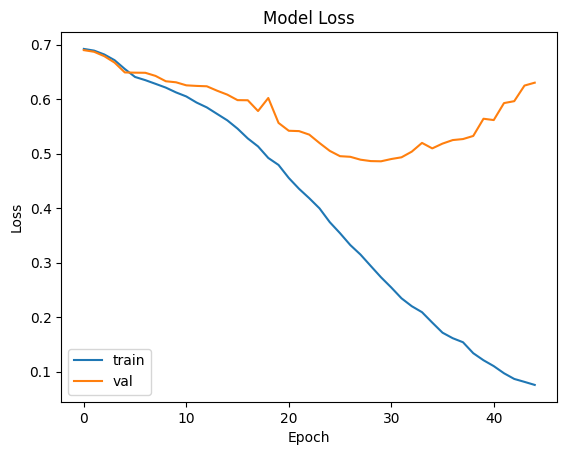

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

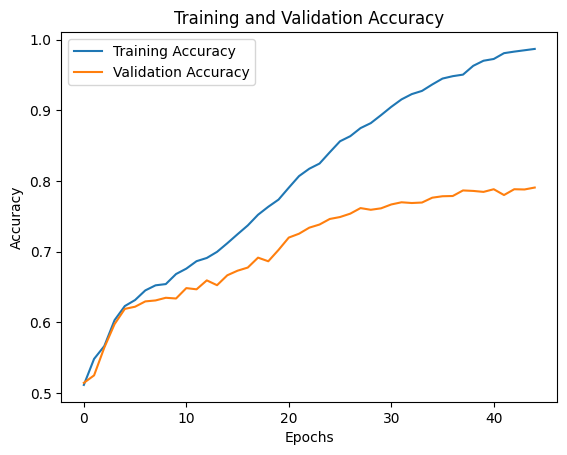

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 53, 100)        │     1,079,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 53, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,359,473 (5.19 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,079,100 (4.12 MB)

 Optimizer params: 186,916 (730.14 KB)

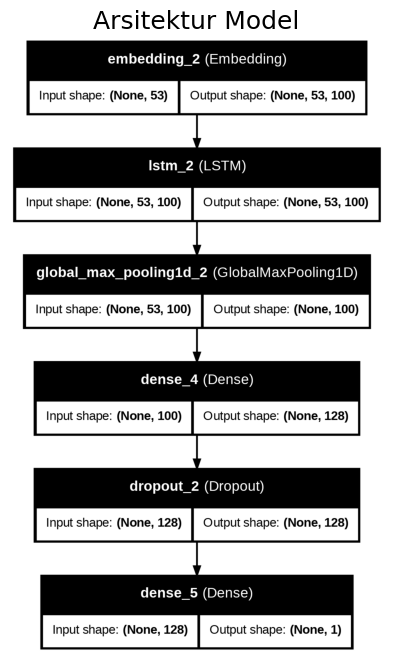

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



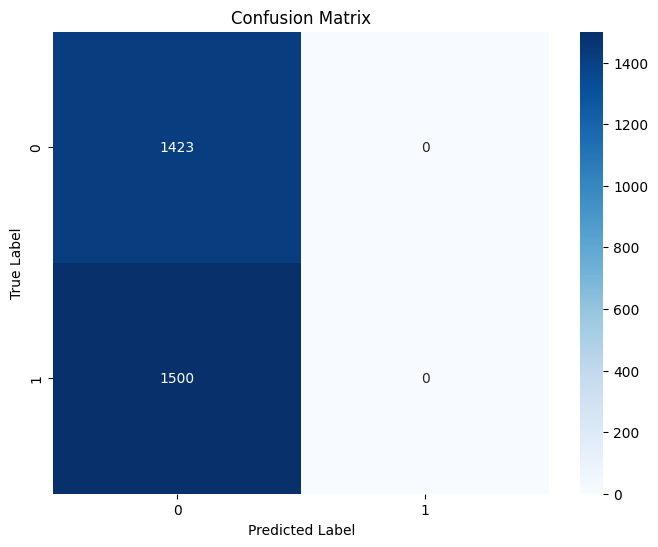

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

# [3. USAirPrePro2 Sütununa göre](#b1)


* #### [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Mounted at /content/drive
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'

df = pd.read_csv(file_path4, encoding='latin1', header=None)
#df = pd.read_csv(file_path4, index_col=0)

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
df.columns=['Text','tokens', 'text_length', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPLSTMPrePRro',
       'score', 'oh_label']

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
#df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df=df.drop(df.index[0])

In [ ]:
df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,finnish bore own rettig famili grown recent acquisit smaller ship compani,1,2,1
9740,"Operating prof

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df['score']

,score
1,-1
2,-1
3,-1
4,-1
5,-1
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
df['score2']

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


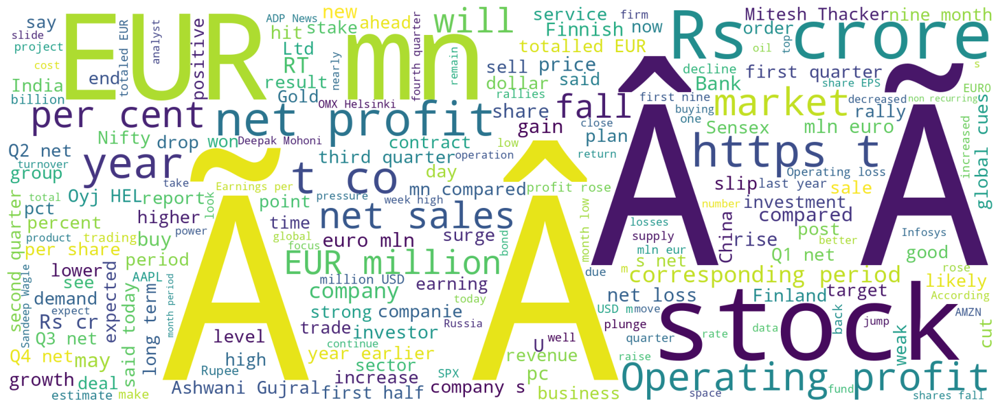

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'
#secilen_kolon_adi='hibrit'
#secilen_kolon_adi='Text'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data.head()

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0


In [ ]:
X_df.head()

,USAirPrePro2
1,wipro growth remains mirage
2,chinese stock leave u investor vulnerable
3,u stock finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza


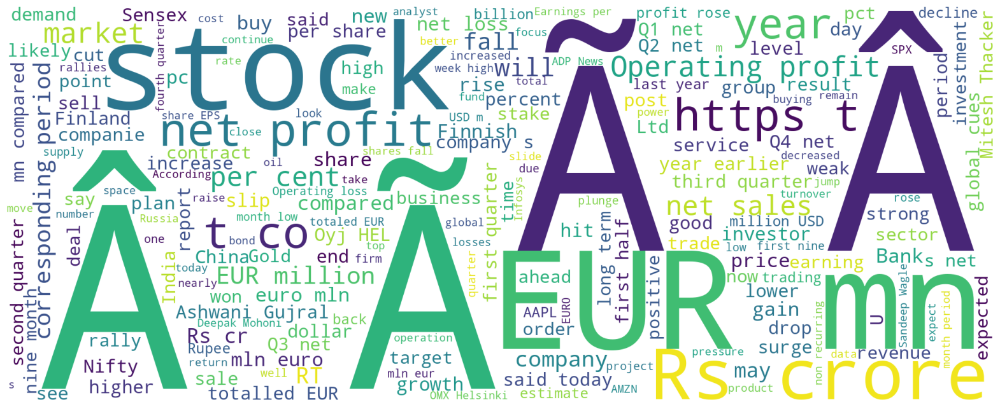

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

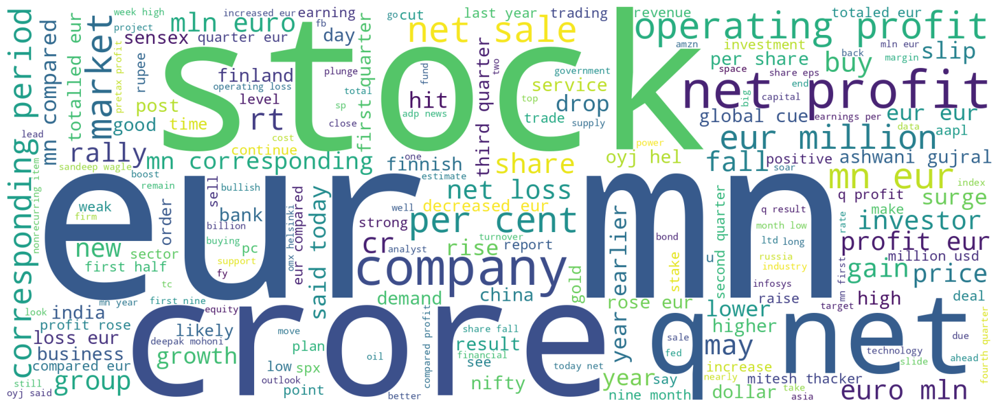

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,USAirPrePro2
1,wipro growth remains mirage
2,chinese stock leave u investor vulnerable
3,u stock finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiation carried constructive manner party tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company
9740,operating profit eur mn eur mn


In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
x

,USAirPrePro2
1,wipro growth remains mirage
2,chinese stock leave u investor vulnerable
3,u stock finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiation carried constructive manner party tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company
9740,operating profit eur mn eur mn


######  [keşifsel veri analizi için deneme](#b1)


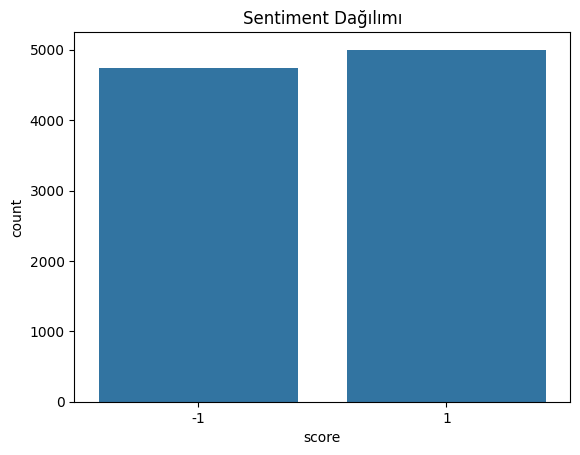

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

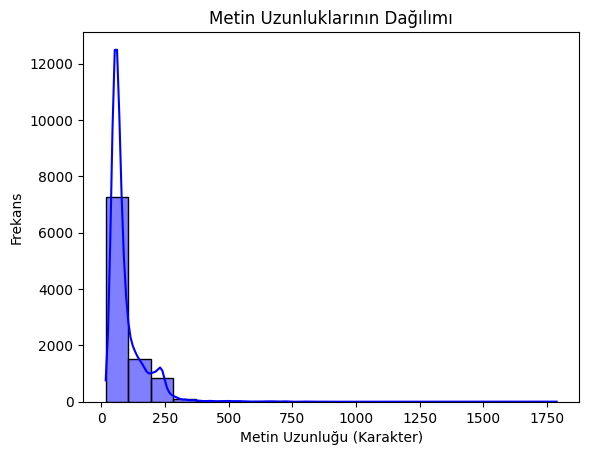

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

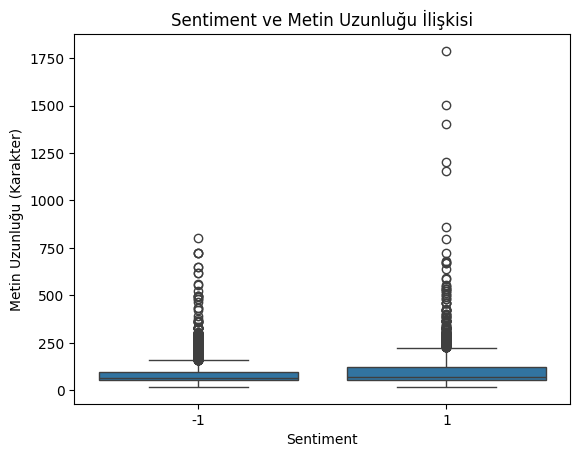

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

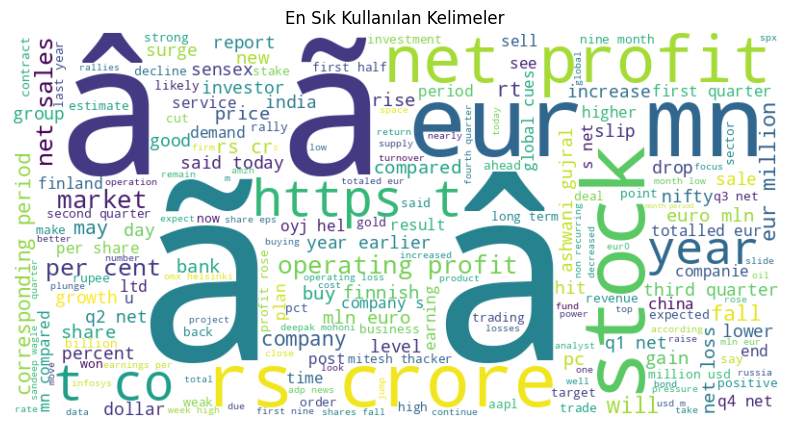

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()


In [ ]:
positive_text

'euronext list first french dutch belgian exchange glaxosmithkline consumer hit week high expansion plan snowman ipo get overwhelming response subscribing time small investor find merit beatendown midcaps like kfa suzlon energy lanco infra jyothy lab q net per cent edelweiss maintains buy irb infrastructure number collection error fell considerably operation speeded february finnish broadband data communication system provider teleste oyj hel tltv saw net profit jump eur last quarter eur period outotec oyj press release february outotec two large mineral processing technology order mirabela mineracao brasil ltda brazil cumerio med jsco bulgaria sensex hit record alltime high nifty race past finnish kci konecranes awarded order four hot metal ladle crane indian steel producer bhushan steel strip delivered acquisition double gcpls topline sistema deal help rcom launch g service later nitin soni initiate fresh long trade essar oil devang visaria finnish software developer basware oyj said

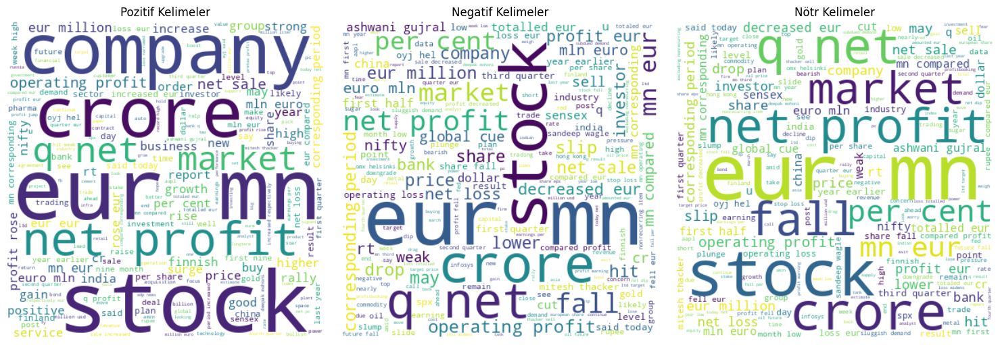

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


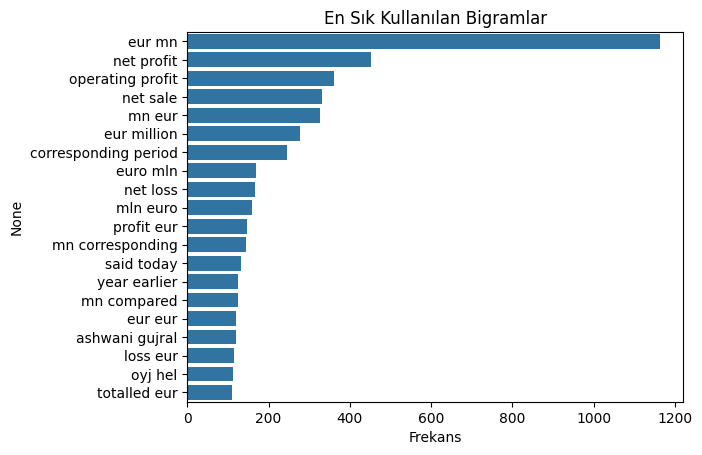

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

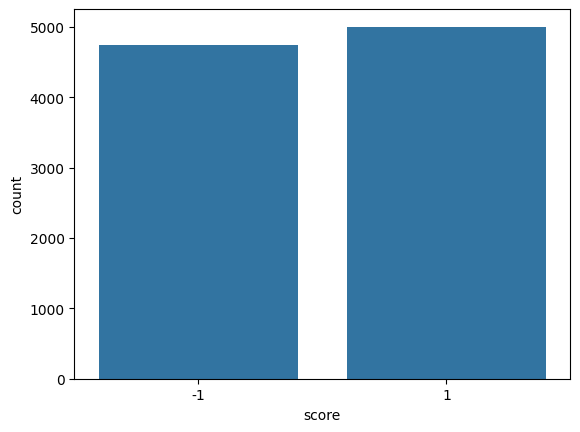

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2', 'Comment'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza
...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation ."
9738,Wockhardt story is really intriguing: Deven Choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .
9740,"Operating profit was EUR 24.5 mn , up from EUR 23.0 mn ."


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,USAirPrePro2
1,wipro growth remains mirage
2,chinese stock leave u investor vulnerable
3,u stock finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiation carried constructive manner party tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company
9740,operating profit eur mn eur mn


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(6818, 8429) (2923, 8429)


In [ ]:
print(test_vectors)

  (0, 242)	0.3144904850406506
  (0, 274)	0.3108073324901809
  (0, 311)	0.23676448741154477
  (0, 881)	0.27063317841317314
  (0, 944)	0.3279704886051915
  (0, 1564)	0.3074191605853802
  (0, 1826)	0.1902607221226957
  (0, 3244)	0.19214234528911395
  (0, 3656)	0.36948855083785775
  (0, 4234)	0.36948855083785775
  (0, 4895)	0.20621438020154273
  (0, 6355)	0.19235667258929304
  (0, 7293)	0.2177998019124827
  (1, 1522)	0.2978962677083836
  (1, 1786)	0.23070187049680785
  (1, 2364)	0.27905054169640625
  (1, 2648)	0.17716722314063654
  (1, 3203)	0.34925867674895816
  (1, 4663)	0.33581634170690455
  (1, 4886)	0.1372211769706627
  (1, 5147)	0.24015546677299326
  (1, 5546)	0.3704450839091184
  (1, 6428)	0.1633103427350551
  (1, 7276)	0.3102670886786779
  (1, 7368)	0.2495923709127293
  :	:
  (2920, 1664)	0.45301524572222085
  (2920, 2515)	0.3434593232037798
  (2920, 2851)	0.385882019633007
  (2920, 2976)	0.3980421589302142
  (2920, 5382)	0.42942569290827975
  (2920, 8180)	0.4301906104926127
  (292


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  84.87854943551146


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

           0       0.84      0.85      0.85      1432
           1       0.85      0.85      0.85      1491

    accuracy                           0.85      2923
   macro avg       0.85      0.85      0.85      2923
weighted avg       0.85      0.85      0.85      2923



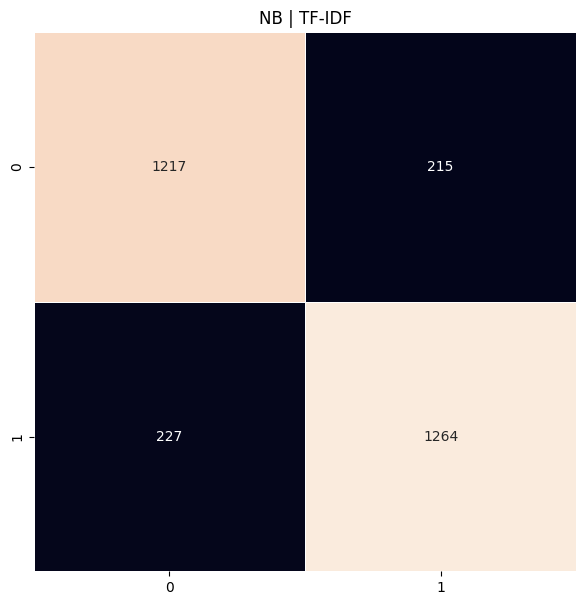

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

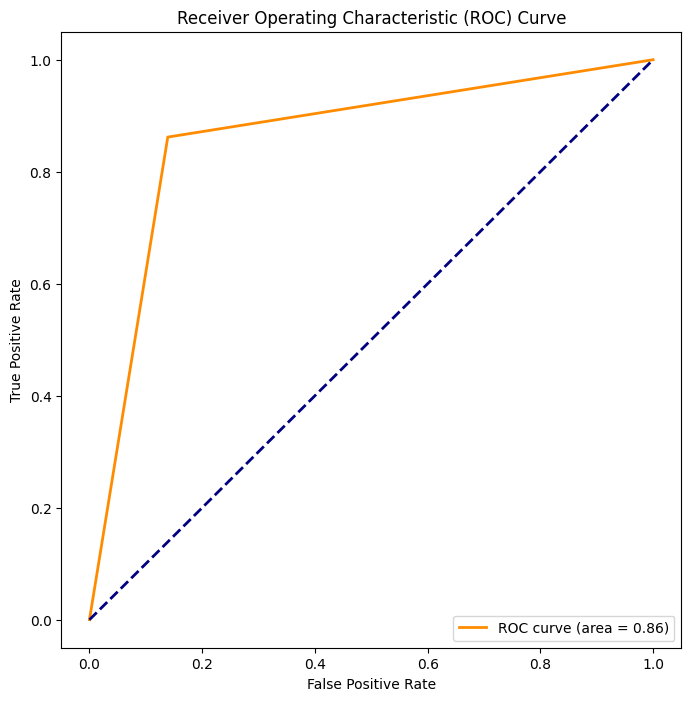

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  86.99965788573384


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.87      0.86      0.87      1432
           1       0.87      0.88      0.87      1491

    accuracy                           0.87      2923
   macro avg       0.87      0.87      0.87      2923
weighted avg       0.87      0.87      0.87      2923



In [ ]:
y_test.head(500)

,score2
3313,0
3669,0
7536,1
5226,1
9618,1
...,...
6276,1
648,0
5091,1
3397,0


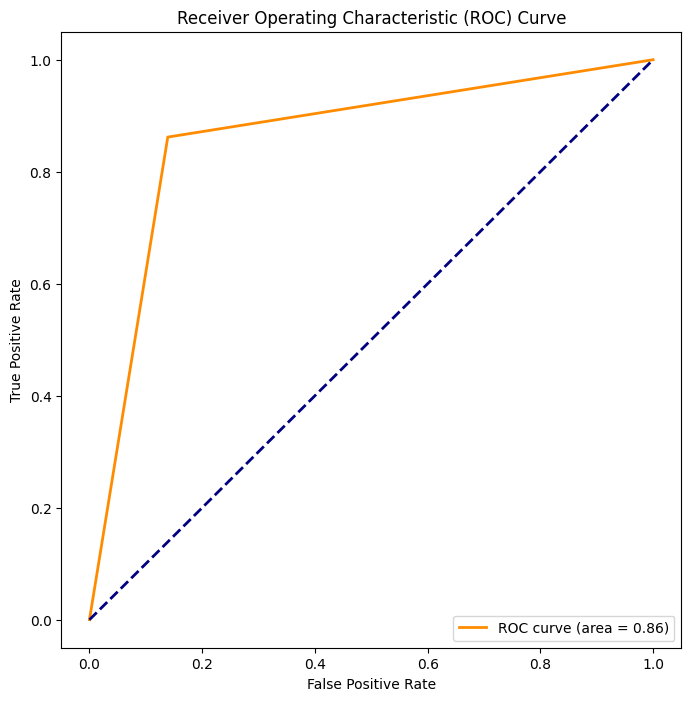

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


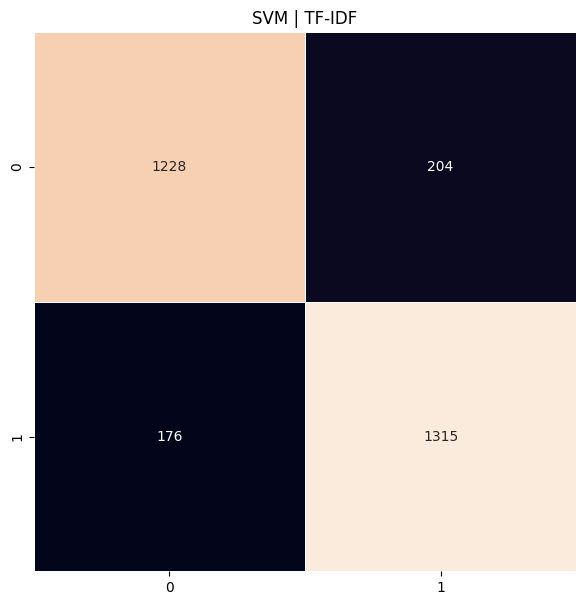

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  85.63120082107424


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      1432
           1       0.84      0.88      0.86      1491

    accuracy                           0.86      2923
   macro avg       0.86      0.86      0.86      2923
weighted avg       0.86      0.86      0.86      2923



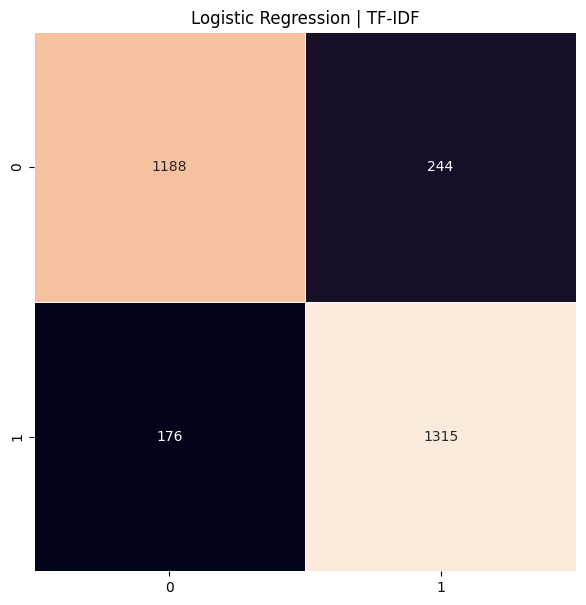

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score2
3313,0
3669,0
7536,1
5226,1
9618,1
...,...
1972,0
2906,0
531,0
3283,0


In [ ]:
predictions_log

array([1, 0, 1, ..., 0, 0, 0])

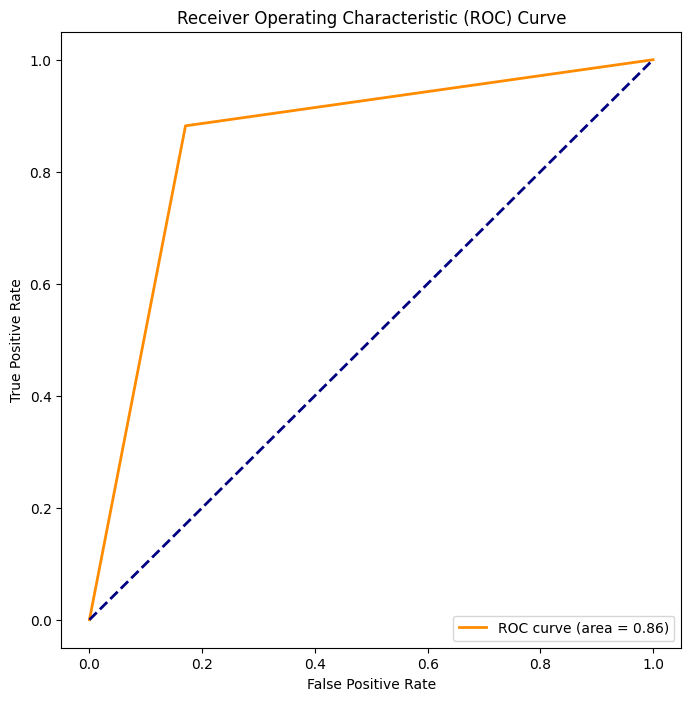

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_test = y_test.astype(int)
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  72.93876154635647


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.72      0.74      0.73      1432
           1       0.74      0.72      0.73      1491

    accuracy                           0.73      2923
   macro avg       0.73      0.73      0.73      2923
weighted avg       0.73      0.73      0.73      2923



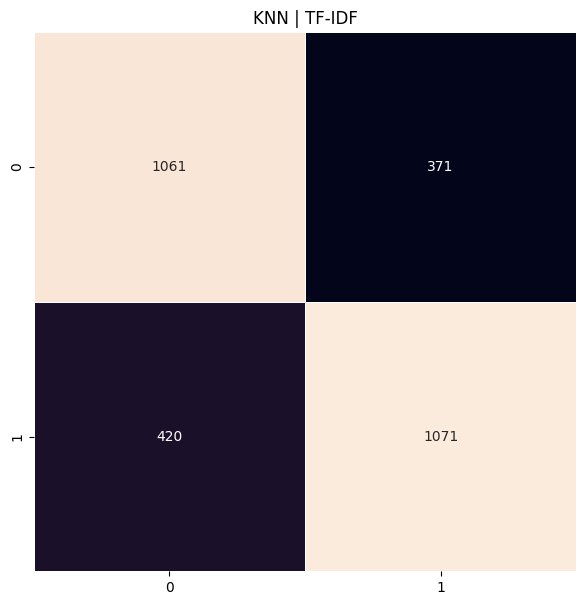

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

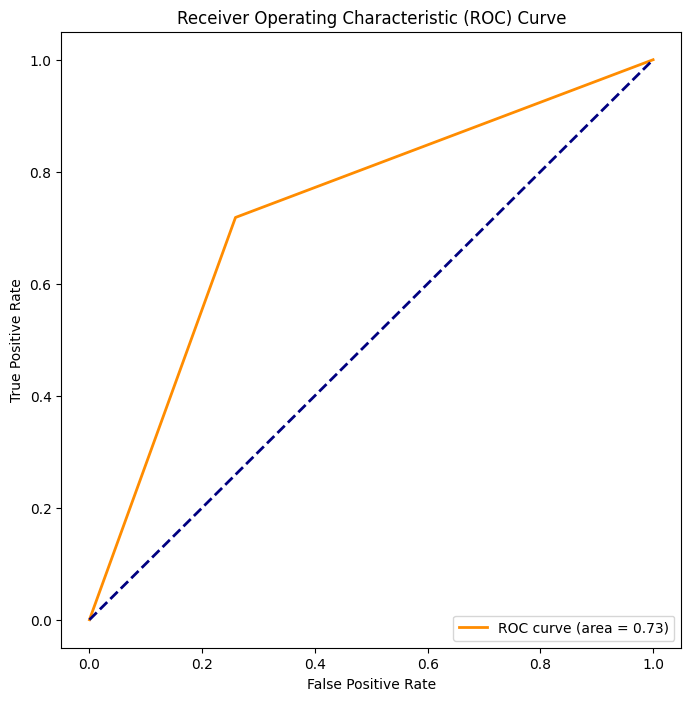

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_test = y_test.astype(int)
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  82.58638385220664


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.82      0.83      0.82      1432
           1       0.84      0.82      0.83      1491

    accuracy                           0.83      2923
   macro avg       0.83      0.83      0.83      2923
weighted avg       0.83      0.83      0.83      2923



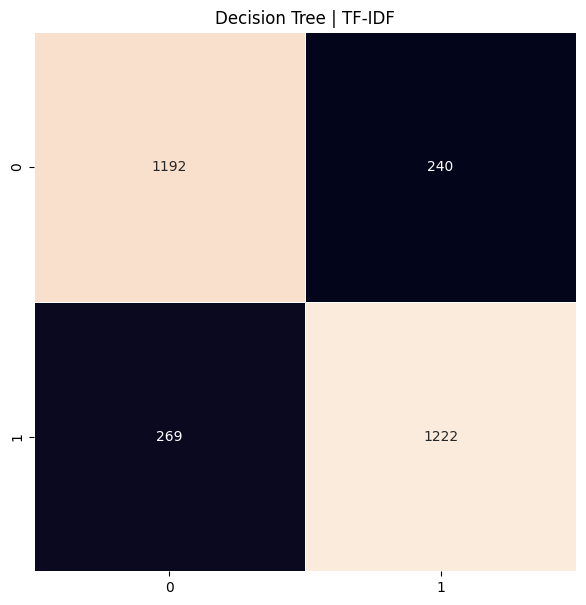

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_test = y_test.astype(int)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  87.06808073896681


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.89      0.84      0.86      1432
           1       0.86      0.90      0.88      1491

    accuracy                           0.87      2923
   macro avg       0.87      0.87      0.87      2923
weighted avg       0.87      0.87      0.87      2923



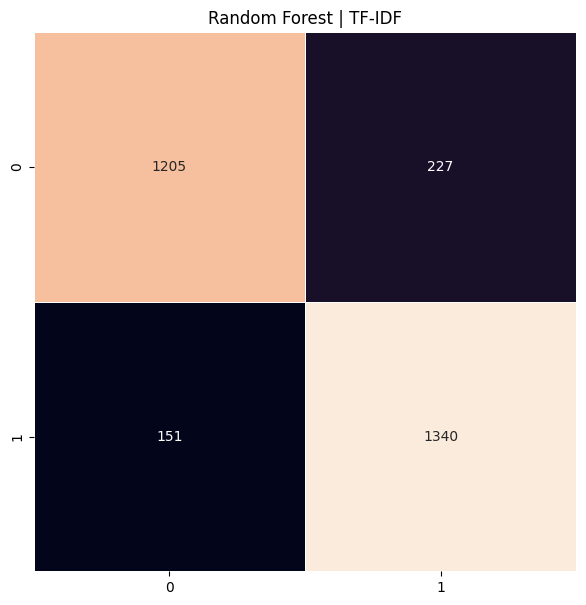

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
y

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(6818, 8429) (2923, 8429)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  84.87854943551146


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.82      0.88      0.85      1432
           1       0.87      0.82      0.85      1491

    accuracy                           0.85      2923
   macro avg       0.85      0.85      0.85      2923
weighted avg       0.85      0.85      0.85      2923



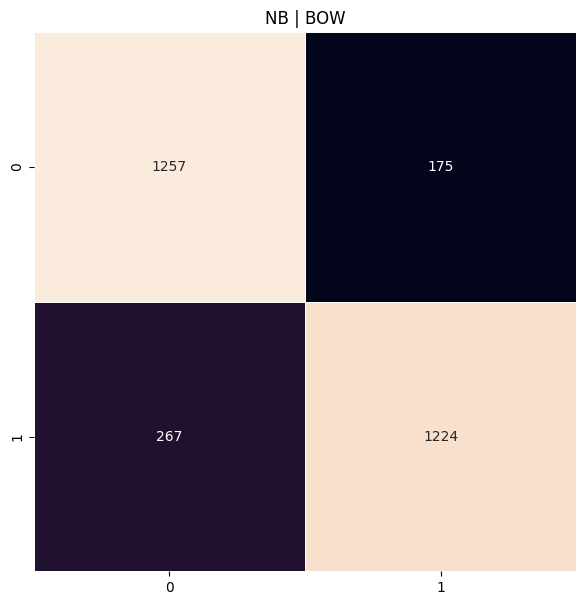

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  85.69962367430722


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.86      0.85      0.85      1432
           1       0.86      0.87      0.86      1491

    accuracy                           0.86      2923
   macro avg       0.86      0.86      0.86      2923
weighted avg       0.86      0.86      0.86      2923



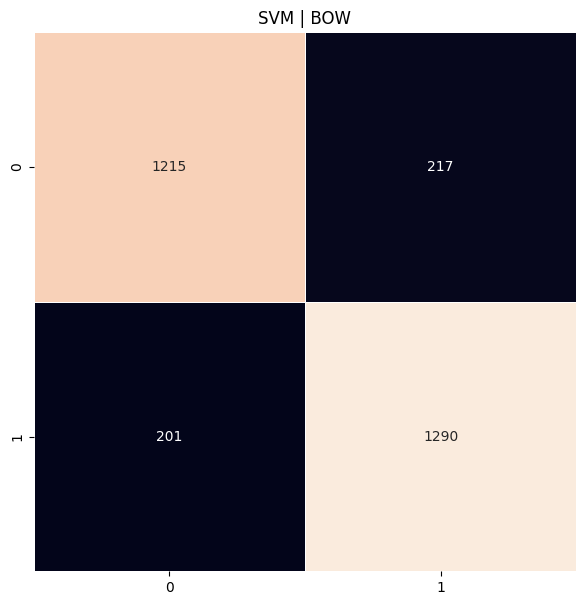

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  86.58912076633595


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.87      0.86      0.86      1432
           1       0.87      0.87      0.87      1491

    accuracy                           0.87      2923
   macro avg       0.87      0.87      0.87      2923
weighted avg       0.87      0.87      0.87      2923



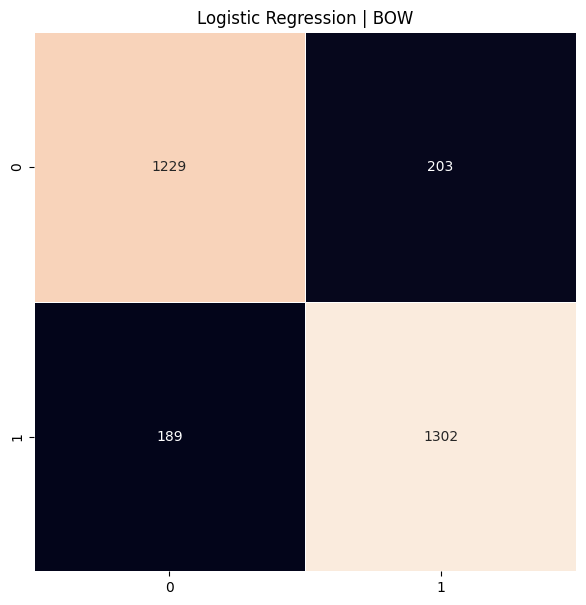

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  83.71536093055082


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.84      0.82      0.83      1432
           1       0.83      0.86      0.84      1491

    accuracy                           0.84      2923
   macro avg       0.84      0.84      0.84      2923
weighted avg       0.84      0.84      0.84      2923



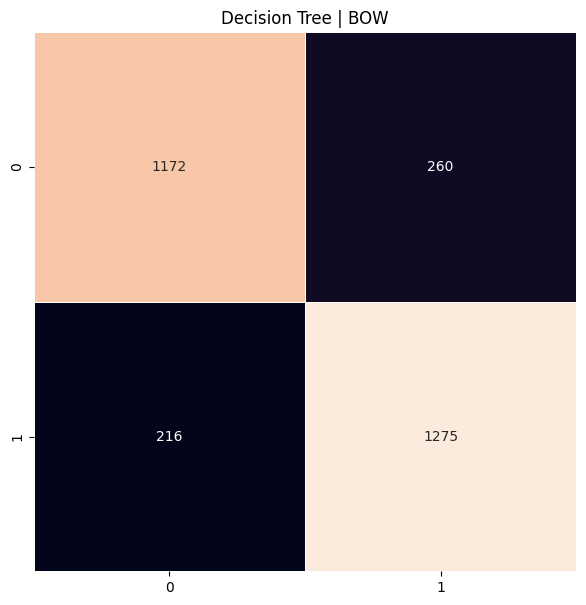

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  87.58125213821415


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.89      0.82      0.85      1432
           1       0.84      0.90      0.87      1491

    accuracy                           0.86      2923
   macro avg       0.87      0.86      0.86      2923
weighted avg       0.86      0.86      0.86      2923



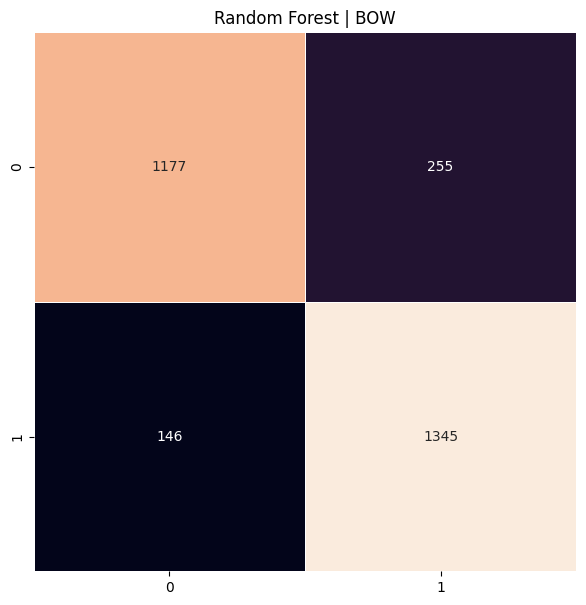

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
data_size=data.shape[0]
data_size

9741

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(1585047, 1882160)

In [ ]:
tokenized_tweet


,USAirPrePro2
1,"[wipro, growth, remains, mirage]"
2,"[chinese, stock, leave, u, investor, vulnerable]"
3,"[u, stock, finish, mixed, amid, tech, selling]"
4,"[opec, reduces, estimate, oil, demand, growth]"
5,"[immediate, support, rupee, placed, bonanza]"
...,...
9737,"[negotiation, carried, constructive, manner, party, tried, find, solution, situation]"
9738,"[wockhardt, story, really, intriguing, deven, choksey]"
9739,"[finnish, bore, owned, rettig, family, grown, recently, acquisition, smaller, shipping, company]"
9740,"[operating, profit, eur, mn, eur, mn]"


In [ ]:
tokenized_tweet.shape

(9741,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 9741


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(9741, 100)
9741


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.298690,0.151855,0.287080,-0.170955,0.137816,-0.336077,-0.087074,0.317894,-0.177596,0.219088,...,0.522009,0.265314,-0.132002,-0.052746,0.517385,0.075292,0.033289,-0.156132,-0.056026,-0.259191
1,-0.330497,0.156259,0.373371,-0.264723,0.160562,-0.360074,-0.180061,0.270586,-0.206020,0.293479,...,0.645543,0.253173,-0.125262,0.037064,0.562015,0.048010,-0.004970,-0.051324,-0.117535,-0.393207
2,-0.315185,0.149307,0.349955,-0.248630,0.158182,-0.343035,-0.160124,0.272635,-0.208969,0.280766,...,0.622565,0.247849,-0.133248,0.020347,0.541782,0.037936,0.001238,-0.053655,-0.109853,-0.376123
3,-0.376378,0.155521,0.354524,-0.230992,0.207740,-0.305553,-0.159085,0.324607,-0.275797,0.350617,...,0.753504,0.299468,-0.193341,0.001439,0.627120,-0.026548,0.001077,-0.070149,-0.138287,-0.474716
4,-0.210950,0.093957,0.235373,-0.160969,0.107108,-0.231691,-0.100739,0.193483,-0.136034,0.194037,...,0.412564,0.171150,-0.088721,0.014347,0.369424,0.026541,-0.001896,-0.043537,-0.070064,-0.254128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9736,-0.190226,0.120358,0.231205,-0.130818,0.094962,-0.257985,-0.080930,0.210142,-0.124543,0.148042,...,0.364805,0.162690,-0.091218,-0.018792,0.343732,0.060434,0.006056,-0.080386,-0.036397,-0.177791
9737,-0.159863,0.085027,0.182513,-0.113865,0.079207,-0.181709,-0.063329,0.145141,-0.108539,0.138916,...,0.314499,0.139359,-0.071329,0.023094,0.301501,0.027571,-0.003853,-0.045338,-0.045593,-0.194815
9738,-0.201585,0.150808,0.249850,-0.118466,0.097457,-0.326345,-0.068176,0.267074,-0.116774,0.129118,...,0.357878,0.196109,-0.099457,-0.057747,0.389182,0.109947,0.018907,-0.131881,-0.013774,-0.128226
9739,-1.101722,0.670065,0.555284,-0.024671,0.278018,-1.812167,0.219133,1.811419,-0.132272,0.271219,...,0.935198,1.426153,-0.420525,-0.967794,2.078391,1.034653,0.438498,-1.791716,0.388529,0.279773


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score2'],random_state=42,test_size=0.3)


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
9120    1
2313    0
2155    0
7896    1
1428    0
Name: score2, dtype: int64


In [ ]:
yvalid.head()

,score2
3313,0
3669,0
7536,1
5226,1
9618,1


In [ ]:
yvalid.shape

(2923,)

In [ ]:
ytrain

,score2
9120,1
2313,0
2155,0
7896,1
1428,0
...,...
5735,1
5192,1
5391,1
861,0


In [ ]:
ytrain.shape

(6818,)

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  58.60417379404721


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.6794368797599816


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.77      0.04      0.08      1432
           1       0.52      0.99      0.68      1491

    accuracy                           0.52      2923
   macro avg       0.64      0.52      0.38      2923
weighted avg       0.64      0.52      0.39      2923



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.36329355199868624

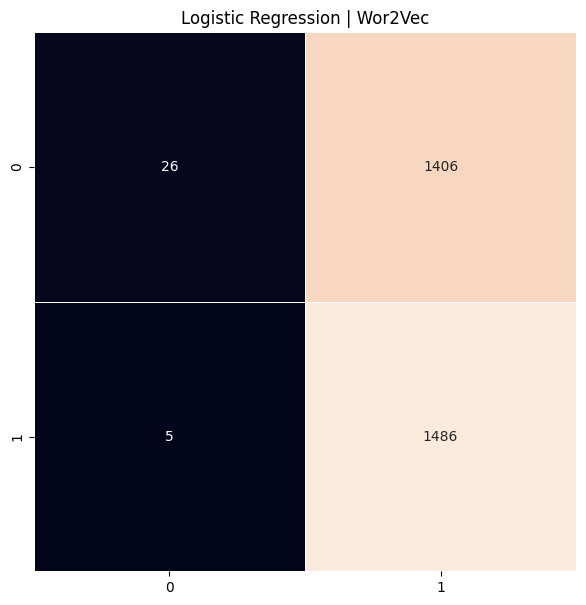

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,ytrain)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  61.717413616147795


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6808905380333952

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.3977769159060727

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.77      0.06      0.10      1432
           1       0.52      0.98      0.68      1491

    accuracy                           0.53      2923
   macro avg       0.65      0.52      0.39      2923
weighted avg       0.64      0.53      0.40      2923



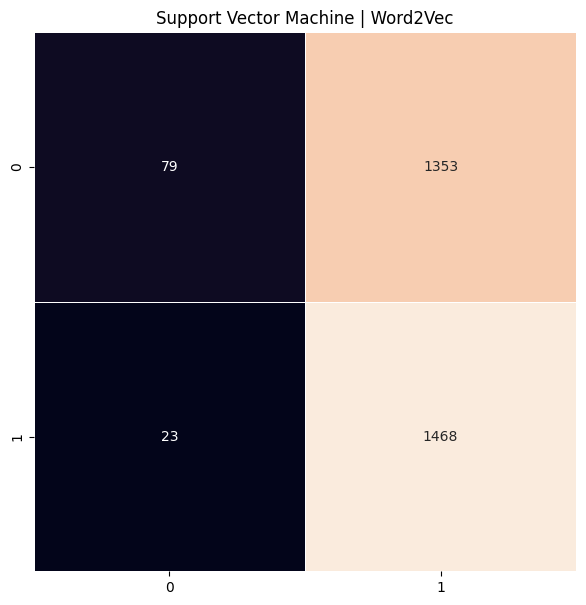

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  67.97810468696545


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.684913217623498

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.6770054775865232

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.67      0.67      0.67      1432
           1       0.68      0.69      0.68      1491

    accuracy                           0.68      2923
   macro avg       0.68      0.68      0.68      2923
weighted avg       0.68      0.68      0.68      2923



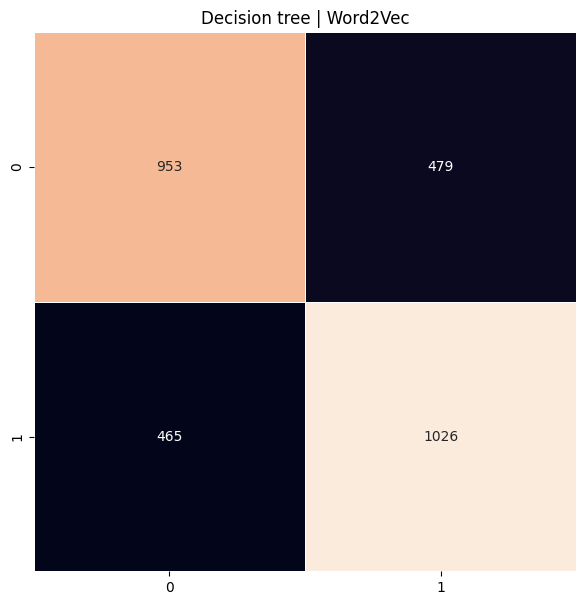

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  70.74923024290113


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.7134699361773598

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.70      0.70      0.70      1432
           1       0.71      0.71      0.71      1491

    accuracy                           0.71      2923
   macro avg       0.71      0.71      0.71      2923
weighted avg       0.71      0.71      0.71      2923



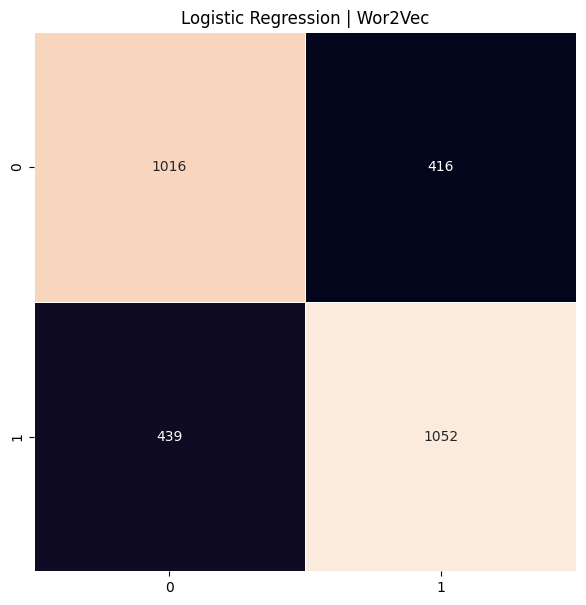

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, predictions_rf_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7075206539189545

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

9741

In [ ]:
tokenized_documents[0]

['wipro', 'growth', 'remains', 'mirage']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=9811, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
eur : 0
net : 1
profit : 2
mn : 3
stock : 4
r : 5
q : 6
share : 7
sale : 8
company : 9
year : 10
crore : 11
loss : 12
million : 13
finnish : 14
quarter : 15
market : 16
operating : 17
period : 18
said : 19
per : 20
fall : 21
bank : 22
mln : 23
price : 24
euro : 25
cent : 26
first : 27
compared : 28
demand : 29
future : 30
month : 31
high : 32
rt : 33
oyj : 34
group : 35
india : 36
oil : 37
corresponding : 38
hit : 39
low : 40
rise : 41
buy : 42
gain : 43
nifty : 44
may : 45
global : 46
sell : 47
u : 48
today : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

47

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 3218


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'china annual dogmeat fair open activist aapl amzn btc eth fb goog msft qqq spy tsla cnbc foxbusiness business money entrepreneur trading investing investment stock stockmarket forex crypto cryptocurrency bitcoin ethereum coinbase robinhood'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'european stocks push higher trade war threats recede https co iybgwmahhv trading tradingview forex eurusd investing investor entrepreneur stocks forexlifestyle wallstreet forexsignals business forextrader technicalanalysis millionaire billionaire https co rdzdsegyq'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


In [ ]:
len(sequences)

9741

In [ ]:
sequences[0]

[554, 59, 832, 6755]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(9741, 47)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
padded_sequences

array([[ 554,   59,  832, ...,    0,    0,    0],
       [ 960,    4, 4205, ...,    0,    0,    0],
       [  48,    4, 3419, ...,    0,    0,    0],
       ...,
       [  14, 3817, 1294, ...,    0,    0,    0],
       [  17,    2,    0, ...,    0,    0,    0],
       [ 529,  298,  274, ...,    0,    0,    0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train_int, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

ValueError: Unrecognized data type: x=[[2634   23    2 ...    0    0    0]
 [4378 4377  130 ...    0    0    0]
 [5789 2407 2850 ...    0    0    0]
 ...
 [1524   23  361 ...    0    0    0]
 [2996  685   23 ...    0    0    0]
 [ 688  122  383 ...    0    0    0]] (of type <class 'numpy.ndarray'>)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(2923,)

In [ ]:
y_train.shape

(6818,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - accuracy: 0.5144 - loss: 0.6925 - val_accuracy: 0.5210 - val_loss: 0.6909
Epoch 2/100


In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 76.12%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_2', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 10791, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.04835467  0.00728365 -0.02886976 ... -0.01539098 -0.04289994
   0.0440156 ]
 [-0.04980941  0.01449585 -0.00381828 ...  0.03310554 -0.00027655
  -0.04745132]
 [-0.00764052 -0.0366341   0.0325239  ... -0.0184583   0.04239482
   0.04964114]
 ...
 [-0.00659444 -0.04645103 -0.00325041 ... -0.02416223 -0.02635704
   0.00330024]
 [ 0.03430137  0.00320065 -0.02725281 ... -0.03977413 -0.02315847
   0.04710848]
 [-0.01885626 -0.02445449  0.02228804 ...  0.01891157 -0.03457322
   0.01850114]]


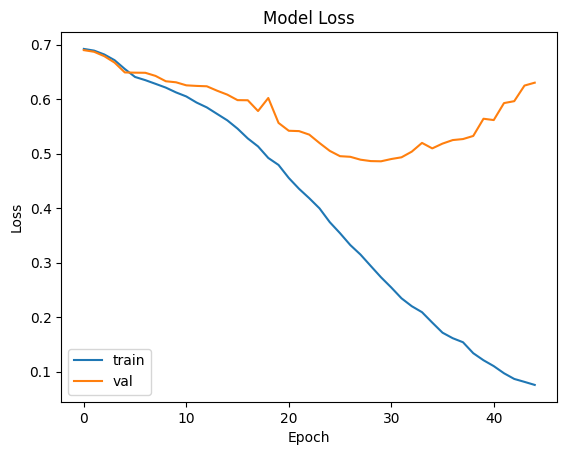

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

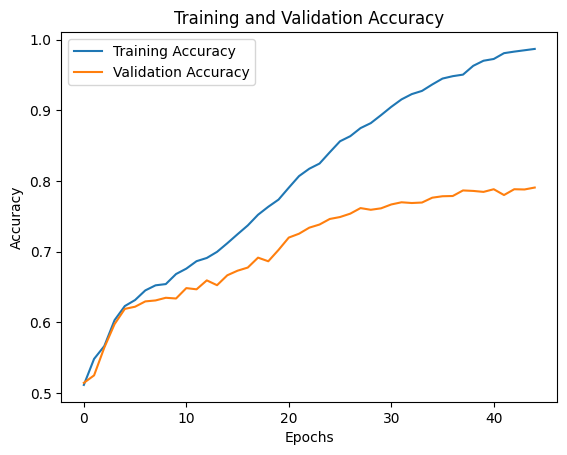

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 53, 100)        │     1,079,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 53, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,359,473 (5.19 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,079,100 (4.12 MB)

 Optimizer params: 186,916 (730.14 KB)

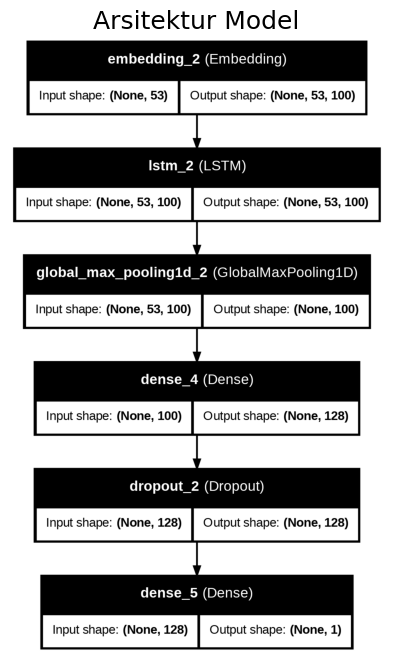

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



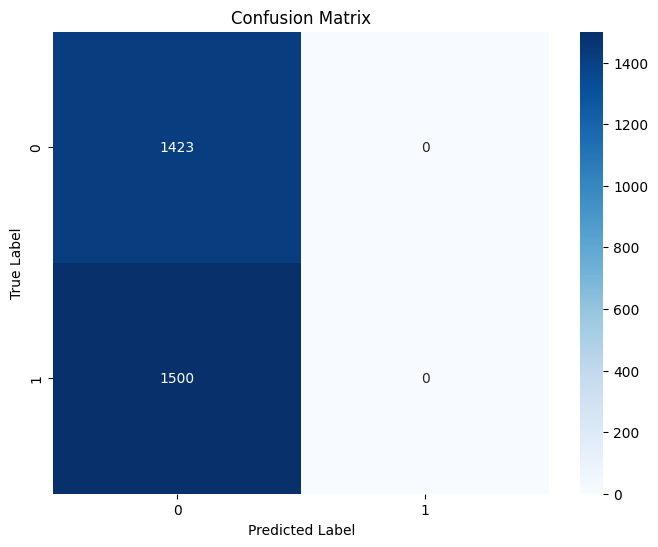

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


# [Son](#b1)
